# Experiment 05: Implementació de la xarxa neuronal Seg-Net per a la segmentació de ferides i grapes alhora

Carregarem els paquets necessaris

In [1]:
import cv2
import glob
import numpy 
import os
import skimage

import tensorflow as tf
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

from matplotlib import pyplot as plt
from numpy.random import seed
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, EarlyStopping, ReduceLROnPlateau
from tensorflow.keras import backend 
from tensorflow.keras.optimizers import *
from typing import Tuple, List

os.environ["CUDA_VISIBLE_DEVICES"]="1"
seed(1)

2024-06-30 17:12:58.629984: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1


## Lectura del *Redscar Dataset* i implementació del generador

Les imatges que s'empraran per a fer l'entrenament les anirem carregant a mesura que la xarxa les demani, per evitar carregar tot el dataset en memòria. Primer de tot, establirem la ruta del dataset.

In [2]:
REDSCAR_DATASET = "/home/marc/UIB_EXPERIMENTS/REDSCAR"
REDSCAR_ML_DATASET = os.path.join(REDSCAR_DATASET, 'SUBSETS', 'MACHINE_LEARNING_DATASET')
REDSCAR_DATASET_IMAGES = os.path.join(REDSCAR_DATASET, 'REDSCAR_DATASET', 'IMAGES')
REDSCAR_DATASET_MASKS_WOUND = os.path.join(REDSCAR_DATASET, 'REDSCAR_DATASET', 'GT_WOUND_MASK')
REDSCAR_DATASET_MASKS_STAPLE = os.path.join(REDSCAR_DATASET, 'REDSCAR_DATASET', 'GT_STAPLES_MASK')

In [3]:
# # DESCOMENTAR PER FER UNA CÀRREGA DES DE ZERO. ALTERNATIVAMENT, EMPRAR EL DATASET JA CARREGAT DINS MEMÒRIA
# def process_image(image_name: str, path: str, size: Tuple[int, int]) -> numpy.array:
#     img = cv2.imread(os.path.join(path, image_name), 1)
#     img = skimage.transform.resize(img, (size[0], size[1], 3))
#     return img

# def process_gt(image_name: str, path: str, size: Tuple[int, int]) -> numpy.array:
#     mask = cv2.imread(os.path.join(path, image_name), 0)
#     mask = cv2.resize(mask, size)

#     mask = mask/255
#     mask[mask < 0.5] = 0
#     mask[mask >= 0.5] = 1
#     return mask

# with open(os.path.join(REDSCAR_ML_DATASET, "train.txt")) as train_file:
#     TRAIN_IMAGES_NAMES = [line.rstrip() for line in train_file]
    
# with open(os.path.join(REDSCAR_ML_DATASET, "test.txt")) as test_file:
#     TEST_IMAGES_NAMES = [line.rstrip() for line in test_file]

# print("-> Loading original images on train set.")
# IMAGES_TRAIN = [process_image(image_name=image_name, path=REDSCAR_DATASET_IMAGES, size=(256, 256)) for image_name in TRAIN_IMAGES_NAMES]
# print("-> Loading original images on test set.")
# IMAGES_TEST = [process_image(image_name=image_name, path=REDSCAR_DATASET_IMAGES, size=(256, 256)) for image_name in TEST_IMAGES_NAMES]
# print("-> Loading masks for wound segmentation task on train set.")
# GROUND_TRUTHS_WOUND_TRAIN = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_WOUND, size=(256, 256)) for image_name in TRAIN_IMAGES_NAMES]
# print("-> Loading masks for wound segmentation task on test set.")
# GROUND_TRUTHS_WOUND_TEST = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_WOUND, size=(256, 256)) for image_name in TEST_IMAGES_NAMES]
# print("-> Loading masks for staples segmentation task on train set.")
# GROUND_TRUTHS_STAPLE_TRAIN = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_STAPLE, size=(256, 256)) for image_name in TRAIN_IMAGES_NAMES]
# print("-> Loading masks for staples segmentation task on test set.")
# GROUND_TRUTHS_STAPLE_TEST = [process_gt(image_name=image_name, path=REDSCAR_DATASET_MASKS_STAPLE, size=(256, 256)) for image_name in TEST_IMAGES_NAMES]

%store -r IMAGES_TRAIN
%store -r IMAGES_TEST
%store -r IMAGES_GRAY_TRAIN
%store -r IMAGES_GRAY_TEST
%store -r GROUND_TRUTHS_WOUND_TRAIN
%store -r GROUND_TRUTHS_WOUND_TEST
%store -r GROUND_TRUTHS_STAPLE_TRAIN
%store -r GROUND_TRUTHS_STAPLE_TEST

In [4]:
def cnn_generator(images: List[numpy.array], 
                  masks_wound: List[numpy.array], 
                  masks_staple: List[numpy.array],
                  batch_size: int):
    assert (len(images)==len(masks_wound)) and (len(images)==len(masks_staple)), "The number of images and masks to be used must match." 
    batch_img = []
    batch_masks = []
    idx = 1
    
    while(True):
        batch_img.append(images[idx % len(images)])
        batch_masks.append(numpy.dstack((masks_wound[idx % len(images)], 
                                         1-masks_wound[idx % len(images)], 
                                         masks_staple[idx % len(images)],
                                         1-masks_staple[idx % len(images)]))) 
        
        if (idx % batch_size == 0) and idx != 0:            
            batch_img = numpy.array(batch_img)
            batch_masks = numpy.array(batch_masks)
            
            yield batch_img, batch_masks
            
            batch_img = []
            batch_masks = []
        idx += 1

# def neural_network_generator(img_path: str, gt_paths: list, size: Tuple[int, int], batch_size: int):
#     # en primer lloc, notem que tenim una llista de gt_paths, enlloc d'un sol str
#     images = sorted(glob.glob(img_path))
#     masks_f = sorted(glob.glob(gt_paths[0]))
#     masks_g = sorted(glob.glob(gt_paths[1]))
#     assert 2*len(images) == len(masks_f) + len(masks_g), "The number of images and masks to be used must match." # hi ha el doble de masks que de images 
#                                                                                 #(per cada imatge, una mask de grapa i una de ferida)
    
#     batch_img = []
#     batch_masks = []
#     idx = 1
    
#     while(True):
#         path_img = images[idx % len(images)]
#         path_mask_f = masks_f[idx % len(images)]
#         path_mask_g = masks_g[idx % len(images)]
        
#         img = cv2.imread(path_img, 1)
#         mask_f = cv2.imread(path_mask_f, 0)
#         mask_g = cv2.imread(path_mask_g, 0)
        
#         img = skimage.transform.resize(img, (size[0], size[1], 3))
#         mask_f = cv2.resize(mask_f, size)
#         mask_g = cv2.resize(mask_g, size)
        
#         mask_f = mask_f/255
#         mask_f[mask_f < 0.5] = 0
#         mask_f[mask_f >= 0.5] = 1
#         mask_f_inverted = 1-mask_f
        
#         mask_g = mask_g/255
#         mask_g[mask_g < 0.5] = 0
#         mask_g[mask_g >= 0.5] = 1
#         mask_g_inverted = 1-mask_g
            
#         batch_img.append(img)
#         batch_masks.append(numpy.dstack((mask_f, mask_f_inverted, mask_g, mask_g_inverted)))
        
#         if (idx%(batch_size) == 0) and idx != 0:            
#             batch_img = numpy.array(batch_img)
#             batch_masks = numpy.array(batch_masks)
            
#             yield batch_img, batch_masks
            
#             batch_img = []
#             batch_masks = []
#         idx += 1

(5, 256, 256, 3) (5, 256, 256, 4)


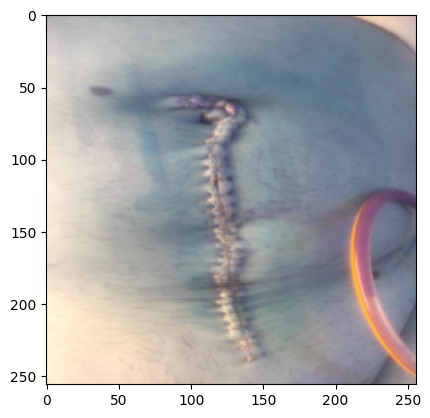

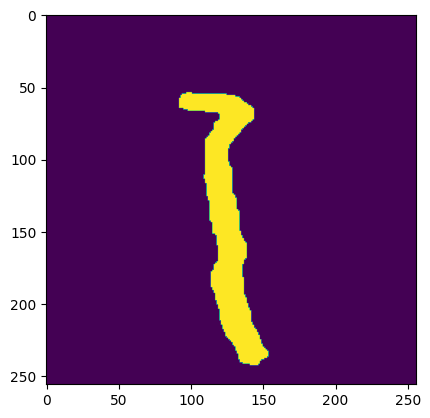

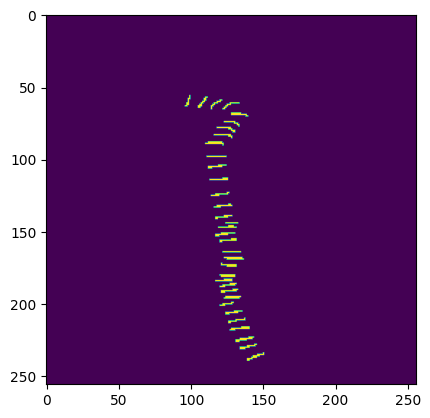

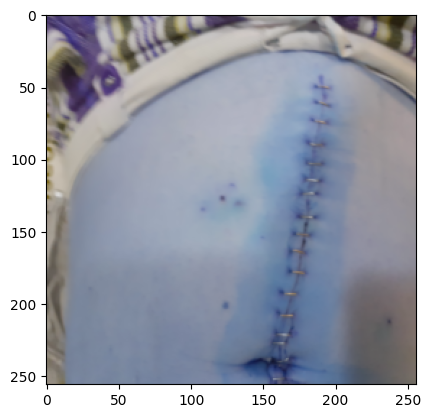

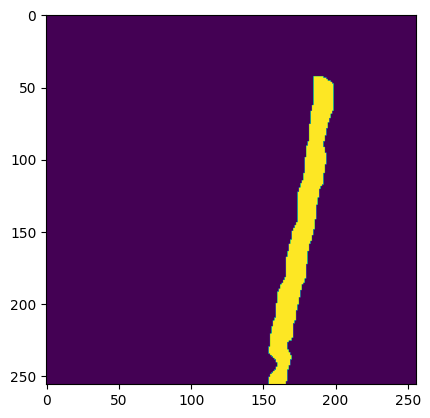

...

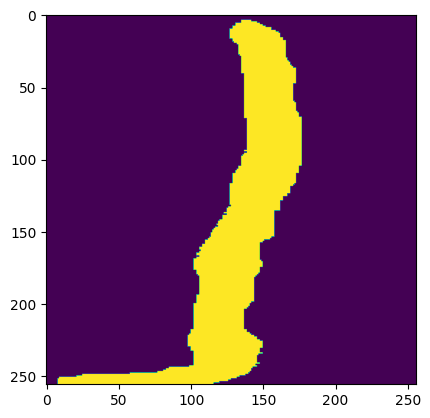

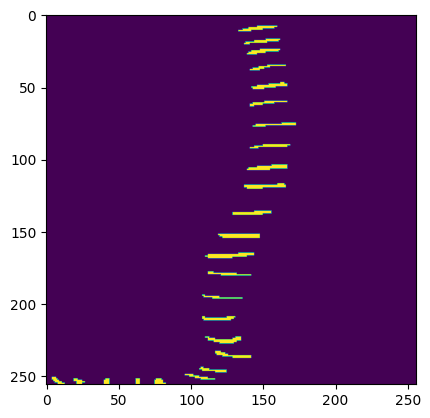

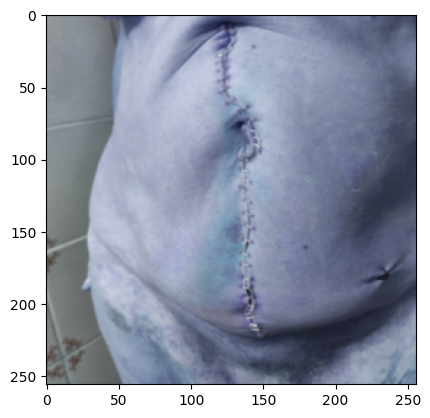

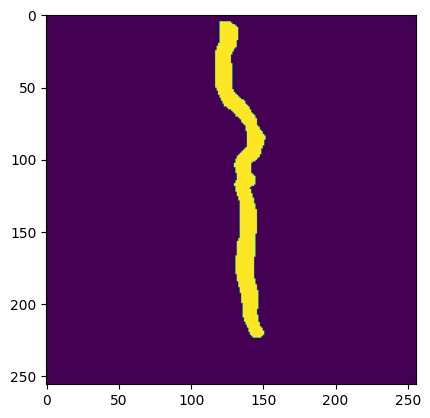

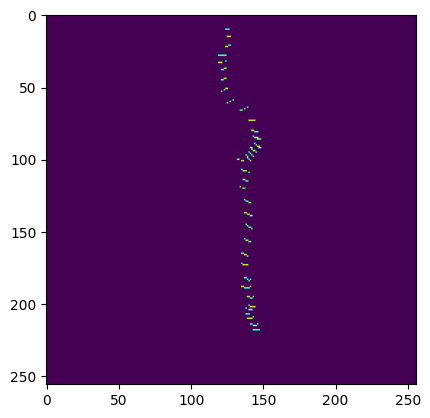

In [5]:
BATCH_SIZE = 5
for image_batch, mask_batch in cnn_generator(images=IMAGES_TRAIN,
                                             masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                                             masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                                             batch_size=BATCH_SIZE):
    print(image_batch.shape, mask_batch.shape)
    for i in range(0, BATCH_SIZE):
        plt.imshow(image_batch[i,:,:])
        plt.show()
        plt.imshow(mask_batch[i,:,:,0])
        plt.show()
        plt.imshow(mask_batch[i,:,:,2])
        plt.show()
    break

## Implementació de la SegNet

L'arquitectura *SegNet* es va proposar per primera vegada a *Convolutional neural networks for
wound detection: the role of artificial
intelligence in wound care*. És una xarxa del tipus codificador-decodificador.

El que farem serà implementar una funció per als blocs de codificació (els de l'esquerra), i una funció per als blocs de decodificació (els de la dreta). A més, la pecularietat d'aquesta xarxa és que introdueix un conjunt de capes anomenades *up-samplers*. 

In [6]:
class MaxPoolingWithArgmax2D(tf.keras.layers.Layer):

    def __init__(
            self,
            pool_size=(2, 2),
            strides=(2, 2),
            padding='same',
            **kwargs):
        super(MaxPoolingWithArgmax2D, self).__init__(**kwargs)
        self.padding = padding
        self.pool_size = pool_size
        self.strides = strides

    def call(self, inputs, **kwargs):
        padding = self.padding
        pool_size = self.pool_size
        strides = self.strides
        ksize = [1, *pool_size, 1]
        padding = padding.upper()
        strides = [1, *strides, 1]
        output, argmax = tf.nn.max_pool_with_argmax(
            inputs,
            ksize=ksize,
            strides=strides,
            padding=padding)

        argmax = tf.cast(argmax, tf.keras.backend.floatx())
        return [output, argmax]

    def compute_output_shape(self, input_shape):
        ratio = (1, 2, 2, 1)
        output_shape = [
            dim // ratio[idx]
            if dim is not None else None
            for idx, dim in enumerate(input_shape)]
        output_shape = tuple(output_shape)
        return [output_shape, output_shape]

    def compute_mask(self, inputs, mask=None):
        return 2 * [None]
    
    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'padding': self.padding,
            'pool_size': self.pool_size,
            'strides': self.strides
        })
        return config


class MaxUnpooling2D(tf.keras.layers.Layer):
    def __init__(self, size=(2, 2), **kwargs):
        super(MaxUnpooling2D, self).__init__(**kwargs)
        self.size = size

    def call(self, inputs, output_shape=None):
        updates, mask = inputs[0], inputs[1]
        mask = tf.cast(mask, 'int32')
        input_shape = tf.shape(updates, out_type='int32')

        if output_shape is None:
            output_shape = (
                input_shape[0],
                input_shape[1] * self.size[0],
                input_shape[2] * self.size[1],
                input_shape[3])

        ret = tf.scatter_nd(tf.keras.backend.expand_dims(tf.keras.layers.Flatten()(mask)),
                            tf.keras.layers.Flatten()(updates),
                            [tf.keras.backend.prod(output_shape)])

        input_shape = updates.shape
        out_shape = [-1,
                     input_shape[1] * self.size[0],
                     input_shape[2] * self.size[1],
                     input_shape[3]]
        
        #return tf.keras.layers.Reshape(target_shape=out_shape)(ret)
        return tf.keras.backend.reshape(ret, out_shape)
        
    def compute_output_shape(self, input_shape):
        mask_shape = input_shape[1]
        return (
            mask_shape[0],
            mask_shape[1] * self.size[0],
            mask_shape[2] * self.size[1],
            mask_shape[3]
        )
    
    def get_config(self):
        config = super().get_config().copy()
        config.update({
            'size': self.size
        })
        return config 

In [7]:
def build_segnet(input_shape=Tuple[int, int, int]):
    num_filters = 32
    n_labels = 2
    # CODIFICADOR
    inputs = tf.keras.layers.Input(shape=input_shape)
    
    conv_1 = tf.keras.layers.Convolution2D(num_filters, (3, 3), padding="same", kernel_initializer='he_normal')(inputs)
    conv_1 = tf.keras.layers.BatchNormalization()(conv_1)
    conv_1 = tf.keras.layers.Activation("relu")(conv_1)

    pool_1, mask_1 = MaxPoolingWithArgmax2D(pool_size=(2, 2))(conv_1)

    conv_2 = tf.keras.layers.Convolution2D(2 * num_filters, (3, 3), padding="same", kernel_initializer='he_normal')(pool_1)
    conv_2 = tf.keras.layers.BatchNormalization()(conv_2)
    conv_2 = tf.keras.layers.Activation("relu")(conv_2)

    pool_2, mask_2 = MaxPoolingWithArgmax2D(pool_size=(2, 2))(conv_2)

    conv_3 = tf.keras.layers.Convolution2D(2 * num_filters, (3, 3), padding="same", kernel_initializer='he_normal')(pool_2)
    conv_3 = tf.keras.layers.BatchNormalization()(conv_3)
    conv_3 = tf.keras.layers.Activation("relu")(conv_3)

    pool_3, mask_3 = MaxPoolingWithArgmax2D(pool_size=(2, 2))(conv_3)

    conv_4 = tf.keras.layers.Convolution2D(4 * num_filters, (3, 3), padding="same", kernel_initializer='he_normal')(pool_3)
    conv_4 = tf.keras.layers.BatchNormalization()(conv_4)
    conv_4 = tf.keras.layers.Activation("relu")(conv_4)

    pool_4, mask_4 = MaxPoolingWithArgmax2D(pool_size=(2, 2))(conv_4)

    unpool_1 = MaxUnpooling2D()([pool_4, mask_4])

    conv_5 = tf.keras.layers.Convolution2D(2 * num_filters, (3, 3), padding="same", kernel_initializer='he_normal')(unpool_1)
    conv_5 = tf.keras.layers.BatchNormalization()(conv_5)
    conv_5 = tf.keras.layers.Activation("relu")(conv_5)

    # DECODIFICADOR FERIDA
    unpool_2_f = MaxUnpooling2D()([conv_5, mask_3])

    conv_6_f = tf.keras.layers.Convolution2D(2 * num_filters, (3, 3), padding="same", kernel_initializer='he_normal')(unpool_2_f)
    conv_6_f = tf.keras.layers.BatchNormalization()(conv_6_f)
    conv_6_f = tf.keras.layers.Activation("relu")(conv_6_f)

    unpool_3_f = MaxUnpooling2D()([conv_6_f, mask_2])

    conv_7_f = tf.keras.layers.Convolution2D(num_filters, (3, 3), padding="same", kernel_initializer='he_normal')(unpool_3_f)
    conv_7_f = tf.keras.layers.BatchNormalization()(conv_7_f)
    conv_7_f = tf.keras.layers.Activation("relu")(conv_7_f)

    unpool_4_f = MaxUnpooling2D()([conv_7_f, mask_1])

    conv_8_f = tf.keras.layers.Convolution2D(n_labels, (1, 1), padding="same", kernel_initializer='he_normal')(unpool_4_f)
    conv_8_f = tf.keras.layers.BatchNormalization()(conv_8_f)
    outputs_f = tf.keras.layers.Activation("softmax")(conv_8_f)
    
    # DECODIFICADOR GRAPA
    unpool_2_g = MaxUnpooling2D()([conv_5, mask_3])

    conv_6_g = tf.keras.layers.Convolution2D(2 * num_filters, (3, 3), padding="same", kernel_initializer='he_normal')(unpool_2_g)
    conv_6_g = tf.keras.layers.BatchNormalization()(conv_6_g)
    conv_6_g = tf.keras.layers.Activation("relu")(conv_6_g)

    unpool_3_g = MaxUnpooling2D()([conv_6_g, mask_2])

    conv_7_g = tf.keras.layers.Convolution2D(num_filters, (3, 3), padding="same", kernel_initializer='he_normal')(unpool_3_g)
    conv_7_g = tf.keras.layers.BatchNormalization()(conv_7_g)
    conv_7_g = tf.keras.layers.Activation("relu")(conv_7_g)

    unpool_4_g = MaxUnpooling2D()([conv_7_g, mask_1])

    conv_8_g = tf.keras.layers.Convolution2D(n_labels, (1, 1), padding="same", kernel_initializer='he_normal')(unpool_4_g)
    conv_8_g = tf.keras.layers.BatchNormalization()(conv_8_g)
    outputs_g = tf.keras.layers.Activation("softmax")(conv_8_g)
    
    outputs = tf.keras.layers.concatenate([outputs_f, outputs_g], axis = -1) 

    model = tf.keras.models.Model(inputs=inputs, outputs=outputs)
    
    return model

## Entrenament de la Seg-Net

Ja ho tenim quasi a punt per a fer l'entrenament. Només ens queda definir la funció de pèrdua. Emprarem el coeficient de dice atès que és una mètrica emprada usualment en aquests casos.

In [8]:
def dice(y_true, y_pred):
    y_true_f = backend.flatten(y_true)
    y_pred_f = backend.flatten(y_pred)
    intersection = backend.sum(y_true_f * y_pred_f)
    return (2.* intersection+1) / (backend.sum(y_true_f) + backend.sum(y_pred_f)+1 )  
    
def dice_wound(y_true_multitask, y_pred_multitask):
    wound_true = tf.stack([y_true_multitask[0], y_true_multitask[1]])
    wound_pred = tf.stack([y_pred_multitask[0], y_pred_multitask[1]])
    return dice(wound_true, wound_pred)

def dice_staple(y_true_multitask, y_pred_multitask):
    staple_true = tf.stack([y_true_multitask[2], y_true_multitask[3]])
    staple_pred = tf.stack([y_pred_multitask[2], y_pred_multitask[3]])
    return dice(staple_true, staple_pred)

def dice_mean(y_true_multitask, y_pred_multitask):
    dice_f = dice_wound(y_true_multitask, y_pred_multitask)
    dice_g = dice_staple(y_true_multitask, y_pred_multitask)
    return (1/2)*(dice_f+dice_g)

def dice_loss(y_true_multitask, y_pred_multitask):
    return 1-dice_mean(y_true_multitask, y_pred_multitask)

Caldrà fer algunes proves per a escollir el learning rate i el nombre d'èpoques

2024-05-13 00:19:59.479455: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2024-05-13 00:19:59.510271: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:06:00.0 name: GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.92GiB deviceMemoryBandwidth: 451.17GiB/s
2024-05-13 00:19:59.510323: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2024-05-13 00:19:59.512332: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2024-05-13 00:19:59.514059: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2024-05-13 00:19:59.514382: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

Epoch 1/70


2024-05-13 00:20:02.584203: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudnn.so.7
2024-05-13 00:20:03.485553: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10


55/55 [==============================] - 3s 53ms/step - loss: 0.4761 - dice_mean: 0.5239 - dice_wound: 0.4933 - dice_staple: 0.5545 - val_loss: 0.5067 - val_dice_mean: 0.4933 - val_dice_wound: 0.4668 - val_dice_staple: 0.5198
Epoch 2/70
55/55 [==============================] - 2s 40ms/step - loss: 0.4509 - dice_mean: 0.5491 - dice_wound: 0.4922 - dice_staple: 0.6060 - val_loss: 0.4996 - val_dice_mean: 0.5004 - val_dice_wound: 0.4505 - val_dice_staple: 0.5503
Epoch 3/70
55/55 [==============================] - 2s 41ms/step - loss: 0.4382 - dice_mean: 0.5618 - dice_wound: 0.4990 - dice_staple: 0.6246 - val_loss: 0.4777 - val_dice_mean: 0.5223 - val_dice_wound: 0.4642 - val_dice_staple: 0.5804
Epoch 4/70
55/55 [==============================] - 2s 41ms/step - loss: 0.4291 - dice_mean: 0.5709 - dice_wound: 0.5073 - dice_staple: 0.6345 - val_loss: 0.4572 - val_dice_mean: 0.5428 - val_dice_wound: 0.4808 - val_dice_staple: 0.6047
Epoch 5/70
55/55 [==============================] - 2s 41ms/ste

55/55 [==============================] - 2s 44ms/step - loss: 0.1945 - dice_mean: 0.8055 - dice_wound: 0.7494 - dice_staple: 0.8616 - val_loss: 0.1983 - val_dice_mean: 0.8017 - val_dice_wound: 0.7408 - val_dice_staple: 0.8627
Epoch 70/70
55/55 [==============================] - 2s 42ms/step - loss: 0.1928 - dice_mean: 0.8072 - dice_wound: 0.7509 - dice_staple: 0.8634 - val_loss: 0.2016 - val_dice_mean: 0.7984 - val_dice_wound: 0.7330 - val_dice_staple: 0.8639
Epoch 1/70
55/55 [==============================] - 3s 52ms/step - loss: 0.4676 - dice_mean: 0.5324 - dice_wound: 0.4617 - dice_staple: 0.6032 - val_loss: 0.5117 - val_dice_mean: 0.4883 - val_dice_wound: 0.4427 - val_dice_staple: 0.5339
Epoch 2/70
55/55 [==============================] - 2s 42ms/step - loss: 0.4442 - dice_mean: 0.5558 - dice_wound: 0.4569 - dice_staple: 0.6547 - val_loss: 0.4993 - val_dice_mean: 0.5007 - val_dice_wound: 0.4199 - val_dice_staple: 0.5816
Epoch 3/70
55/55 [==============================] - 2s 40ms/st

55/55 [==============================] - 2s 40ms/step - loss: 0.1407 - dice_mean: 0.8593 - dice_wound: 0.8282 - dice_staple: 0.8905 - val_loss: 0.1448 - val_dice_mean: 0.8552 - val_dice_wound: 0.8108 - val_dice_staple: 0.8995
Epoch 68/70
55/55 [==============================] - 2s 42ms/step - loss: 0.1391 - dice_mean: 0.8609 - dice_wound: 0.8297 - dice_staple: 0.8921 - val_loss: 0.1408 - val_dice_mean: 0.8592 - val_dice_wound: 0.8181 - val_dice_staple: 0.9002
Epoch 69/70
55/55 [==============================] - 2s 41ms/step - loss: 0.1375 - dice_mean: 0.8625 - dice_wound: 0.8315 - dice_staple: 0.8935 - val_loss: 0.1472 - val_dice_mean: 0.8528 - val_dice_wound: 0.8110 - val_dice_staple: 0.8946
Epoch 70/70
55/55 [==============================] - 2s 41ms/step - loss: 0.1361 - dice_mean: 0.8639 - dice_wound: 0.8328 - dice_staple: 0.8951 - val_loss: 0.1453 - val_dice_mean: 0.8547 - val_dice_wound: 0.8131 - val_dice_staple: 0.8963
Epoch 1/70
55/55 [==============================] - 3s 58ms/

55/55 [==============================] - 2s 38ms/step - loss: 0.1296 - dice_mean: 0.8704 - dice_wound: 0.8238 - dice_staple: 0.9171 - val_loss: 0.1311 - val_dice_mean: 0.8689 - val_dice_wound: 0.8198 - val_dice_staple: 0.9180
Epoch 66/70
55/55 [==============================] - 2s 40ms/step - loss: 0.1278 - dice_mean: 0.8722 - dice_wound: 0.8260 - dice_staple: 0.9183 - val_loss: 0.1361 - val_dice_mean: 0.8639 - val_dice_wound: 0.8040 - val_dice_staple: 0.9238
Epoch 67/70
55/55 [==============================] - 2s 41ms/step - loss: 0.1265 - dice_mean: 0.8735 - dice_wound: 0.8275 - dice_staple: 0.9195 - val_loss: 0.1350 - val_dice_mean: 0.8650 - val_dice_wound: 0.8009 - val_dice_staple: 0.9290
Epoch 68/70
55/55 [==============================] - 2s 41ms/step - loss: 0.1253 - dice_mean: 0.8747 - dice_wound: 0.8288 - dice_staple: 0.9207 - val_loss: 0.1289 - val_dice_mean: 0.8711 - val_dice_wound: 0.8136 - val_dice_staple: 0.9286
Epoch 69/70
55/55 [==============================] - 2s 41ms

55/55 [==============================] - 2s 41ms/step - loss: 0.1316 - dice_mean: 0.8684 - dice_wound: 0.8051 - dice_staple: 0.9317 - val_loss: 0.1413 - val_dice_mean: 0.8587 - val_dice_wound: 0.7774 - val_dice_staple: 0.9400
Epoch 64/70
55/55 [==============================] - 2s 40ms/step - loss: 0.1307 - dice_mean: 0.8693 - dice_wound: 0.8061 - dice_staple: 0.9326 - val_loss: 0.1391 - val_dice_mean: 0.8609 - val_dice_wound: 0.7876 - val_dice_staple: 0.9342
Epoch 65/70
55/55 [==============================] - 2s 40ms/step - loss: 0.1298 - dice_mean: 0.8702 - dice_wound: 0.8069 - dice_staple: 0.9335 - val_loss: 0.1400 - val_dice_mean: 0.8600 - val_dice_wound: 0.7860 - val_dice_staple: 0.9340
Epoch 66/70
55/55 [==============================] - 2s 40ms/step - loss: 0.1290 - dice_mean: 0.8710 - dice_wound: 0.8077 - dice_staple: 0.9344 - val_loss: 0.1375 - val_dice_mean: 0.8625 - val_dice_wound: 0.7849 - val_dice_staple: 0.9400
Epoch 67/70
55/55 [==============================] - 2s 39ms

55/55 [==============================] - 2s 41ms/step - loss: 0.1089 - dice_mean: 0.8911 - dice_wound: 0.8480 - dice_staple: 0.9341 - val_loss: 0.1111 - val_dice_mean: 0.8889 - val_dice_wound: 0.8380 - val_dice_staple: 0.9398
Epoch 62/70
55/55 [==============================] - 2s 39ms/step - loss: 0.1075 - dice_mean: 0.8925 - dice_wound: 0.8500 - dice_staple: 0.9349 - val_loss: 0.1093 - val_dice_mean: 0.8907 - val_dice_wound: 0.8362 - val_dice_staple: 0.9453
Epoch 63/70
55/55 [==============================] - 2s 39ms/step - loss: 0.1065 - dice_mean: 0.8935 - dice_wound: 0.8511 - dice_staple: 0.9359 - val_loss: 0.1046 - val_dice_mean: 0.8954 - val_dice_wound: 0.8460 - val_dice_staple: 0.9447
Epoch 64/70
55/55 [==============================] - 2s 39ms/step - loss: 0.1057 - dice_mean: 0.8943 - dice_wound: 0.8520 - dice_staple: 0.9367 - val_loss: 0.1047 - val_dice_mean: 0.8953 - val_dice_wound: 0.8516 - val_dice_staple: 0.9389
Epoch 65/70
55/55 [==============================] - 2s 40ms

55/55 [==============================] - 2s 41ms/step - loss: 0.1167 - dice_mean: 0.8833 - dice_wound: 0.8248 - dice_staple: 0.9418 - val_loss: 0.1246 - val_dice_mean: 0.8754 - val_dice_wound: 0.8078 - val_dice_staple: 0.9429
Epoch 60/70
55/55 [==============================] - 2s 39ms/step - loss: 0.1145 - dice_mean: 0.8855 - dice_wound: 0.8288 - dice_staple: 0.9421 - val_loss: 0.1184 - val_dice_mean: 0.8816 - val_dice_wound: 0.8211 - val_dice_staple: 0.9421
Epoch 61/70
55/55 [==============================] - 2s 40ms/step - loss: 0.1110 - dice_mean: 0.8890 - dice_wound: 0.8357 - dice_staple: 0.9423 - val_loss: 0.1191 - val_dice_mean: 0.8809 - val_dice_wound: 0.8136 - val_dice_staple: 0.9482
Epoch 62/70
55/55 [==============================] - 2s 40ms/step - loss: 0.1102 - dice_mean: 0.8898 - dice_wound: 0.8365 - dice_staple: 0.9431 - val_loss: 0.1167 - val_dice_mean: 0.8833 - val_dice_wound: 0.8131 - val_dice_staple: 0.9535
Epoch 63/70
55/55 [==============================] - 2s 40ms

55/55 [==============================] - 2s 38ms/step - loss: 0.1062 - dice_mean: 0.8938 - dice_wound: 0.8427 - dice_staple: 0.9448 - val_loss: 0.1078 - val_dice_mean: 0.8922 - val_dice_wound: 0.8296 - val_dice_staple: 0.9548
Epoch 58/70
55/55 [==============================] - 2s 38ms/step - loss: 0.1056 - dice_mean: 0.8944 - dice_wound: 0.8434 - dice_staple: 0.9454 - val_loss: 0.1059 - val_dice_mean: 0.8941 - val_dice_wound: 0.8349 - val_dice_staple: 0.9532
Epoch 59/70
55/55 [==============================] - 2s 40ms/step - loss: 0.1050 - dice_mean: 0.8950 - dice_wound: 0.8440 - dice_staple: 0.9460 - val_loss: 0.1080 - val_dice_mean: 0.8920 - val_dice_wound: 0.8367 - val_dice_staple: 0.9473
Epoch 60/70
55/55 [==============================] - 2s 39ms/step - loss: 0.1044 - dice_mean: 0.8956 - dice_wound: 0.8445 - dice_staple: 0.9466 - val_loss: 0.1091 - val_dice_mean: 0.8909 - val_dice_wound: 0.8355 - val_dice_staple: 0.9463
Epoch 61/70
55/55 [==============================] - 2s 38ms

55/55 [==============================] - 2s 39ms/step - loss: 0.3877 - dice_mean: 0.6123 - dice_wound: 0.5701 - dice_staple: 0.6545 - val_loss: 0.3826 - val_dice_mean: 0.6174 - val_dice_wound: 0.5789 - val_dice_staple: 0.6560
Epoch 40/70
55/55 [==============================] - 2s 39ms/step - loss: 0.3861 - dice_mean: 0.6139 - dice_wound: 0.5719 - dice_staple: 0.6559 - val_loss: 0.3835 - val_dice_mean: 0.6165 - val_dice_wound: 0.5765 - val_dice_staple: 0.6566
Epoch 41/70
55/55 [==============================] - 2s 39ms/step - loss: 0.3846 - dice_mean: 0.6154 - dice_wound: 0.5735 - dice_staple: 0.6573 - val_loss: 0.3817 - val_dice_mean: 0.6183 - val_dice_wound: 0.5773 - val_dice_staple: 0.6593
Epoch 42/70
55/55 [==============================] - 2s 39ms/step - loss: 0.3831 - dice_mean: 0.6169 - dice_wound: 0.5750 - dice_staple: 0.6588 - val_loss: 0.3809 - val_dice_mean: 0.6191 - val_dice_wound: 0.5763 - val_dice_staple: 0.6619
Epoch 43/70
55/55 [==============================] - 2s 39ms

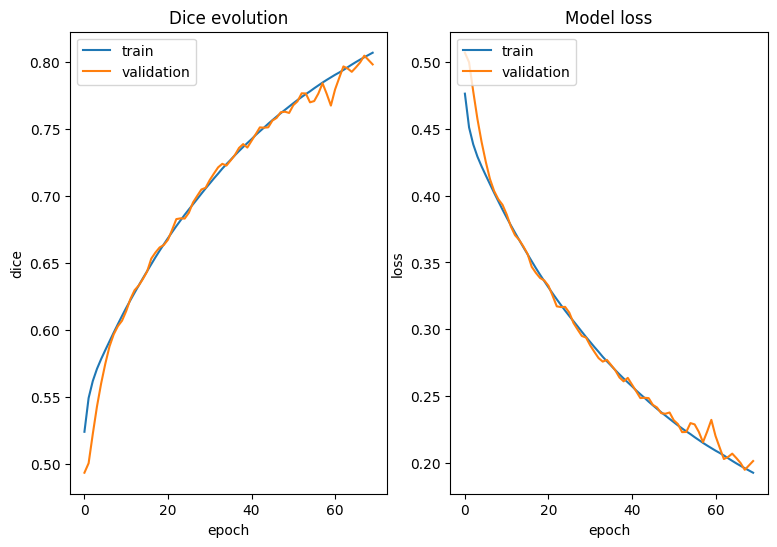

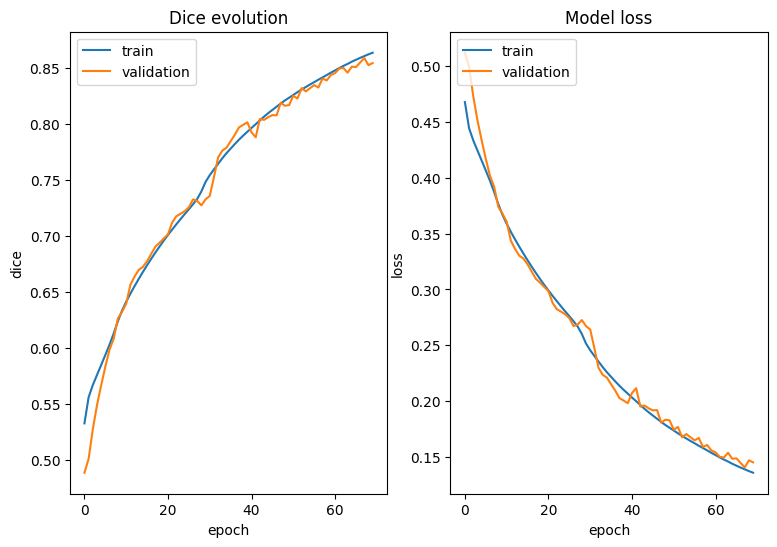

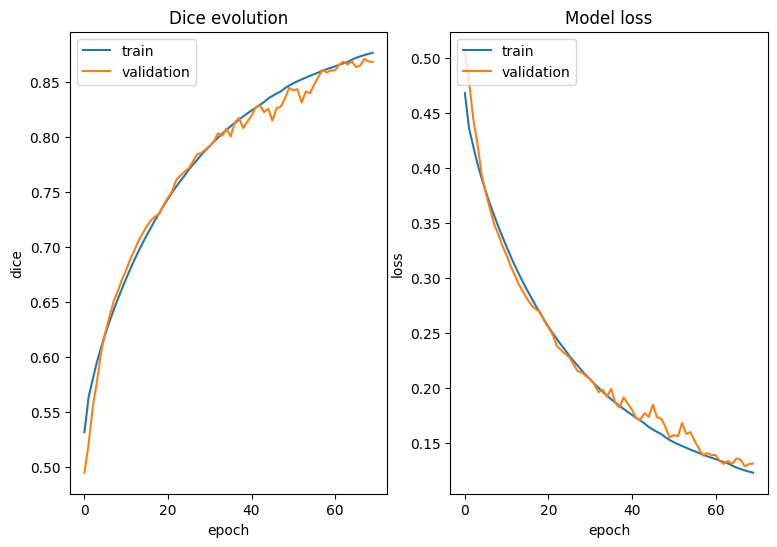

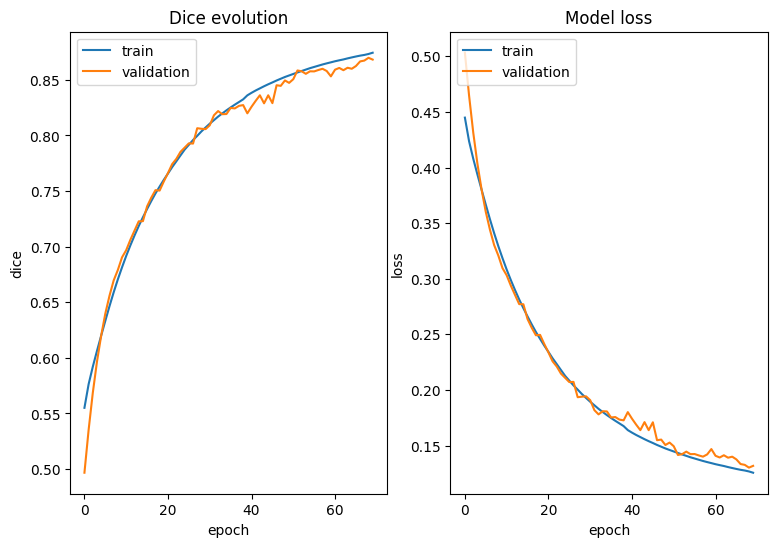

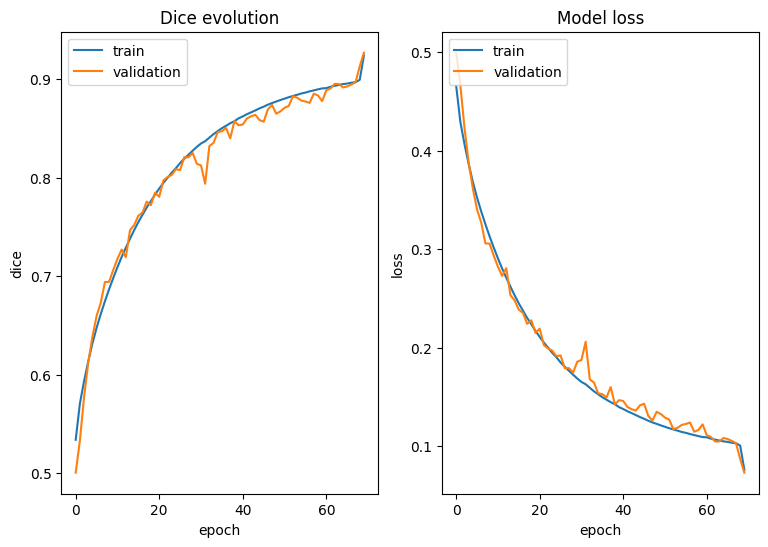

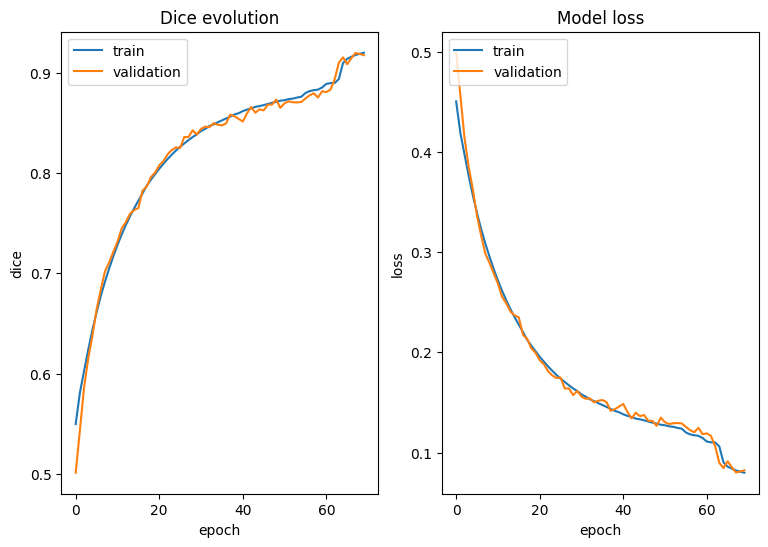

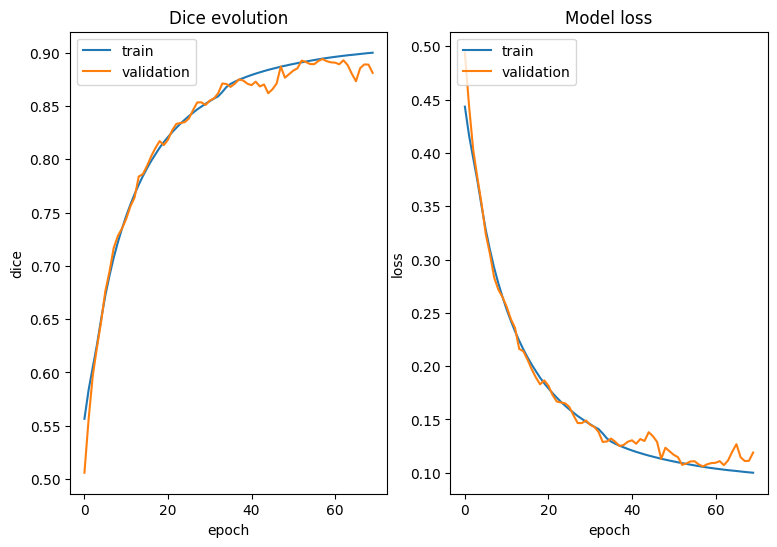

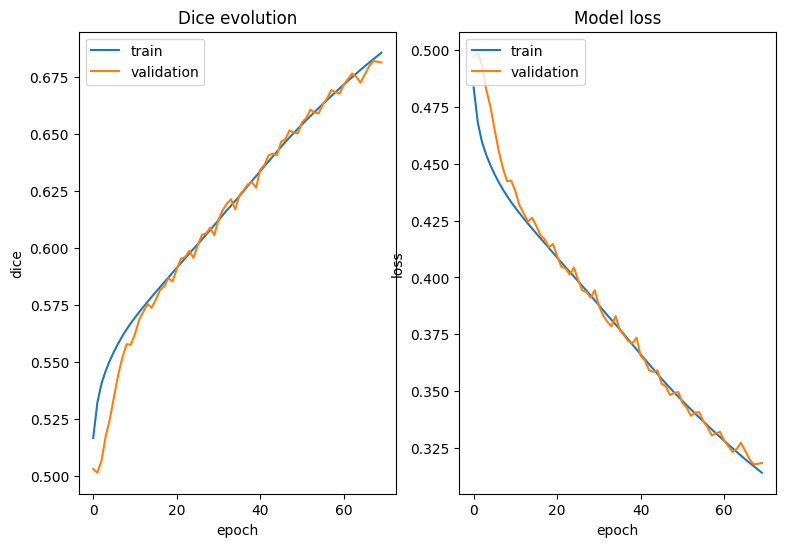

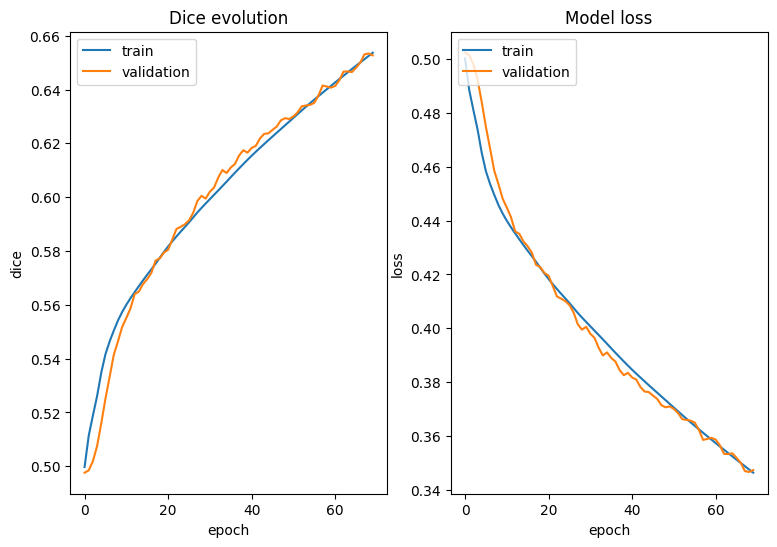

In [9]:
alphas = [2e-4, 3e-4, 4e-4, 5e-4, 6e-4, 7e-4, 8e-4, 7e-5, 5e-5]
for a in alphas:
    segnet = build_segnet(input_shape=(256, 256, 3))
    segnet.compile(optimizer=Adam(learning_rate = a), loss=dice_loss, metrics = [dice_mean, dice_wound, dice_staple])
    
    BATCH_SIZE = 5
    TOTAL_IMAGES_TRAIN = 275
    TOTAL_IMAGES_TEST = 119
    STEPS_PER_EPOCH = TOTAL_IMAGES_TRAIN // BATCH_SIZE 
    VALIDATION_STEPS = TOTAL_IMAGES_TEST // BATCH_SIZE
    EPOCHS = 70

    reduceLROnPlat = ReduceLROnPlateau(monitor='dice_mean', factor=0.5,
                                   patience=3,
                                   verbose=1, mode='max', cooldown=2, min_lr=1e-7)
    early = EarlyStopping(monitor="dice_mean",
                      mode="max",
                      patience=8)

    CALLBACKS = [early, reduceLROnPlat]

    TRAIN_GENERATOR = cnn_generator(images=IMAGES_TRAIN,
                                masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                                masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                                batch_size=BATCH_SIZE)

    TEST_GENERATOR = cnn_generator(images=IMAGES_TEST,
                                   masks_wound=GROUND_TRUTHS_WOUND_TEST,
                                   masks_staple=GROUND_TRUTHS_STAPLE_TEST,
                                   batch_size=BATCH_SIZE)
    
    training_history = segnet.fit(TRAIN_GENERATOR, 
                           validation_data=TEST_GENERATOR,
                           epochs=EPOCHS,
                           validation_steps=VALIDATION_STEPS,
                           callbacks=CALLBACKS,
                           steps_per_epoch=STEPS_PER_EPOCH)
    
    plt.figure(figsize=(9,6), dpi= 100, facecolor='w', edgecolor='k')

    plt.subplot(1,2,1)
    plt.plot(training_history.history['dice_mean'])
    plt.plot(training_history.history['val_dice_mean'])
    plt.title('Dice evolution')
    plt.ylabel('dice')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')

    # "Loss"
    plt.subplot(1,2,2)
    plt.plot(training_history.history['loss'])
    plt.plot(training_history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')

    EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment05'
    plt.savefig(EXPERIMENT_PATH+rf"/segnet_multitasca_rendiment_prova_{a}.png")
    
    del segnet
    

Ara sí, entrenem i guardem el model òptim:

2024-06-30 17:14:31.299717: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2024-06-30 17:14:31.344403: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:06:00.0 name: GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.92GiB deviceMemoryBandwidth: 451.17GiB/s
2024-06-30 17:14:31.344460: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2024-06-30 17:14:31.346940: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2024-06-30 17:14:31.349030: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2024-06-30 17:14:31.349428: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

Epoch 1/70


2024-06-30 17:14:34.565655: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudnn.so.7
2024-06-30 17:14:35.264744: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10


55/55 [==============================] - 3s 50ms/step - loss: 0.4490 - dice_mean: 0.5510 - dice_wound: 0.4896 - dice_staple: 0.6124 - val_loss: 0.5148 - val_dice_mean: 0.4852 - val_dice_wound: 0.4247 - val_dice_staple: 0.5456
Epoch 2/70
55/55 [==============================] - 2s 40ms/step - loss: 0.4148 - dice_mean: 0.5852 - dice_wound: 0.5053 - dice_staple: 0.6651 - val_loss: 0.4695 - val_dice_mean: 0.5305 - val_dice_wound: 0.4624 - val_dice_staple: 0.5986
Epoch 3/70
55/55 [==============================] - 2s 39ms/step - loss: 0.3917 - dice_mean: 0.6083 - dice_wound: 0.5348 - dice_staple: 0.6817 - val_loss: 0.4185 - val_dice_mean: 0.5815 - val_dice_wound: 0.5169 - val_dice_staple: 0.6461
Epoch 4/70
55/55 [==============================] - 2s 39ms/step - loss: 0.3694 - dice_mean: 0.6306 - dice_wound: 0.5662 - dice_staple: 0.6949 - val_loss: 0.3746 - val_dice_mean: 0.6254 - val_dice_wound: 0.5705 - val_dice_staple: 0.6804
Epoch 5/70
55/55 [==============================] - 2s 40ms/ste

55/55 [==============================] - 2s 41ms/step - loss: 0.1371 - dice_mean: 0.8629 - dice_wound: 0.8054 - dice_staple: 0.9205 - val_loss: 0.1396 - val_dice_mean: 0.8604 - val_dice_wound: 0.7998 - val_dice_staple: 0.9211
Epoch 36/70
55/55 [==============================] - 2s 40ms/step - loss: 0.1354 - dice_mean: 0.8646 - dice_wound: 0.8069 - dice_staple: 0.9224 - val_loss: 0.1366 - val_dice_mean: 0.8634 - val_dice_wound: 0.8000 - val_dice_staple: 0.9269
Epoch 37/70
55/55 [==============================] - 2s 40ms/step - loss: 0.1337 - dice_mean: 0.8663 - dice_wound: 0.8084 - dice_staple: 0.9241 - val_loss: 0.1332 - val_dice_mean: 0.8668 - val_dice_wound: 0.8017 - val_dice_staple: 0.9320
Epoch 38/70
55/55 [==============================] - 2s 40ms/step - loss: 0.1322 - dice_mean: 0.8678 - dice_wound: 0.8098 - dice_staple: 0.9258 - val_loss: 0.1292 - val_dice_mean: 0.8708 - val_dice_wound: 0.8071 - val_dice_staple: 0.9344
Epoch 39/70
55/55 [==============================] - 2s 41ms

55/55 [==============================] - 2s 41ms/step - loss: 0.1048 - dice_mean: 0.8952 - dice_wound: 0.8394 - dice_staple: 0.9509 - val_loss: 0.1124 - val_dice_mean: 0.8876 - val_dice_wound: 0.8232 - val_dice_staple: 0.9519
Epoch 70/70
55/55 [==============================] - 2s 41ms/step - loss: 0.1044 - dice_mean: 0.8956 - dice_wound: 0.8398 - dice_staple: 0.9513 - val_loss: 0.1093 - val_dice_mean: 0.8907 - val_dice_wound: 0.8298 - val_dice_staple: 0.9516


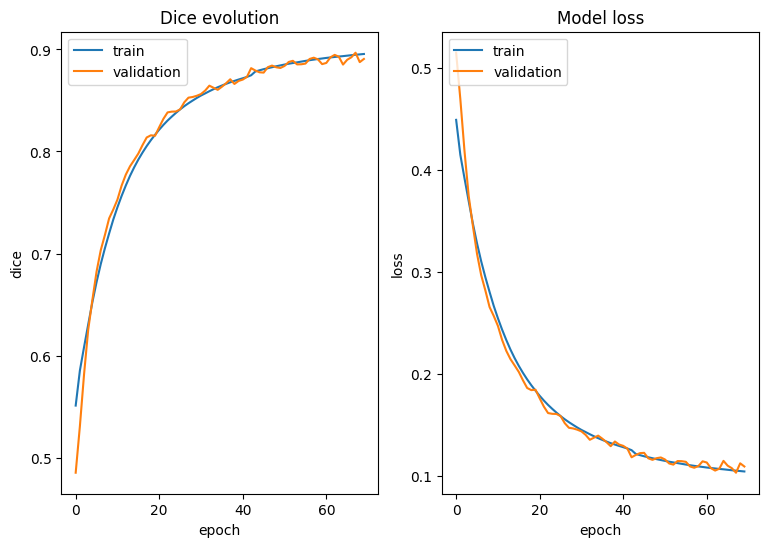

In [9]:
segnet = build_segnet(input_shape=(256, 256, 3))
segnet.compile(optimizer=Adam(learning_rate = 8e-4), loss=dice_loss, metrics = [dice_mean, dice_wound, dice_staple])

BATCH_SIZE = 5
TOTAL_IMAGES_TRAIN = 275
TOTAL_IMAGES_TEST = 119
STEPS_PER_EPOCH = TOTAL_IMAGES_TRAIN // BATCH_SIZE 
VALIDATION_STEPS = TOTAL_IMAGES_TEST // BATCH_SIZE
EPOCHS = 70

reduceLROnPlat = ReduceLROnPlateau(monitor='dice_mean', factor=0.5,
                               patience=3,
                               verbose=1, mode='max', cooldown=2, min_lr=1e-7)
early = EarlyStopping(monitor="dice_mean",
                  mode="max",
                  patience=8)

CALLBACKS = [early, reduceLROnPlat]

TRAIN_GENERATOR = cnn_generator(images=IMAGES_TRAIN,
                            masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                            masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                            batch_size=BATCH_SIZE)

TEST_GENERATOR = cnn_generator(images=IMAGES_TEST,
                               masks_wound=GROUND_TRUTHS_WOUND_TEST,
                               masks_staple=GROUND_TRUTHS_STAPLE_TEST,
                               batch_size=BATCH_SIZE)

training_history = segnet.fit(TRAIN_GENERATOR, 
                       validation_data=TEST_GENERATOR,
                       epochs=EPOCHS,
                       validation_steps=VALIDATION_STEPS,
                       callbacks=CALLBACKS,
                       steps_per_epoch=STEPS_PER_EPOCH)

plt.figure(figsize=(9,6), dpi= 100, facecolor='w', edgecolor='k')

plt.subplot(1,2,1)
plt.plot(training_history.history['dice_mean'])
plt.plot(training_history.history['val_dice_mean'])
plt.title('Dice evolution')
plt.ylabel('dice')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

# "Loss"
plt.subplot(1,2,2)
plt.plot(training_history.history['loss'])
plt.plot(training_history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')

EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment05'
plt.savefig(EXPERIMENT_PATH+rf"/segnet_multitasca.png")

In [10]:
EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment05'
segnet.save(os.path.join(EXPERIMENT_PATH, "segnet_multitasca.h5"))

In [12]:
from tensorflow.keras.models import load_model
EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment05'
loaded_model = load_model(os.path.join(EXPERIMENT_PATH, "segnet_multitasca.h5"), 
                          custom_objects={'dice_loss': dice_loss, 
                                          'dice_mean': dice_mean,
                                          'dice_wound': dice_wound, 
                                          'dice_staple': dice_staple,
                                          'dice': dice,
                                          'MaxPoolingWithArgmax2D': MaxPoolingWithArgmax2D,
                                          'MaxUnpooling2D': MaxUnpooling2D})

## Prediccions amb la Seg-Net

Fins ara hem implementat la Seg-Net, l'hem entrenat i hem guardat els pesos a un fitxer per a poder fer futures prediccions. Això és el que pretenem fer en aquesta secció: passar-li una imatge a la Seg-Net, i que ens faci la predicció. 

És important observar un fet: quan li passam imatges amb el generador, li estem donant amb una certa mida, i la xarxa ens torna les imatges també amb una certa mida de sortida. Però clar, no totes les imatges del dataset tenen la mateixa mida, ni tampoc tenen la mateixa mida $256\times 256$ que li imposam a la xarxa. Per aquest motiu, és important establir un criteri. Com que les màscares ens determinen la posició exacta de l'objecte, farem el següent:

1. Donada una imatge sobre la que volem fer la predicció, canviar la seva mida a la dimensió d'entrada de la xarxa.
2. Calcular la predicció del model, que ens tornarà una imatge en la dimensió de sortida del mateix. Aquesta sortida serà, **en el cas de la Seg-Net**, una imatge amb entrades dins l'interval $[0,1]$, que podem interpretar com una imatge en escala de grisos.
3. Redimensionar aquesta sortida amb les dimensions de la imatge en qüestió.
4. Binaritzar el resultat de la passa anterior.
5. Comparar amb la màscara.

Un dubte que pot sorgir és si les passes 3 i 4 es poden permutar. La resposta és que no. Si primer binaritzam, quan facem el canvi d'escala posterior la imatge resultant **no** és, en general, binària. Hem de pensar que fer un canvi d'escala aplica per darrere una sèrie de tècniques d'interpolació, que poden donar lloc a imatges en escala de grisos, que no són comparables a la passa 4 amb la màscara final.

In [13]:
def predict_image(model: tf.keras.models.Model, model_input: Tuple[int, int], image: numpy.ndarray, binary_threshold: float=0.5):
    resized_image = skimage.transform.resize(image, (model_input[0], model_input[1], 3)) #Passa 1
    prediction_raw = model.predict(numpy.array([resized_image])) # Passa 2 -> ens dóna un tensor 256x256x4
    
    # PREDICCIO FERIDA
    # Passa 3
    prediction0_f = prediction_raw[0][:,:,0]
    prediction1_f = prediction_raw[0][:,:,1]
    prediction_resized0_f = skimage.transform.resize(prediction0_f, (image.shape[0], image.shape[1]))
    prediction_resized1_f = skimage.transform.resize(prediction1_f, (image.shape[0], image.shape[1]))
    prediction_binary_bool_f = numpy.greater_equal(prediction_resized0_f, prediction_resized1_f)
    prediction_binary_f = 255*prediction_binary_bool_f
    
    # PREDICCIO GRAPA
    # Passa 3
    prediction0_g = prediction_raw[0][:,:,2]
    prediction1_g = prediction_raw[0][:,:,3]
    prediction_resized0_g = skimage.transform.resize(prediction0_g, (image.shape[0], image.shape[1]))
    prediction_resized1_g = skimage.transform.resize(prediction1_g, (image.shape[0], image.shape[1]))
    prediction_binary_bool_g = numpy.greater_equal(prediction_resized0_g,prediction_resized1_g)
    prediction_binary_g = 255*prediction_binary_bool_g
    
    return prediction_binary_f, prediction_binary_g

Ara implementarem dues funcions que reben per paràmetres la gt i la predicció i ens retornen la mètrica: la dice i la jaccard.

In [10]:
from sklearn.metrics import confusion_matrix
def metriques_absolutes(gt_image, prediction):
    (n,m) = numpy.shape(gt_image)  
    
    if (n,m) != numpy.shape(prediction): # comprovació que les mides de la imatge de la predicció i la de la gt coincideixen
        return []
    
    # si les mides coincideixen, calcularem les mètriques absolutes
    # Convert images to binary arrays
    gt_binary = numpy.asarray(gt_image).ravel()
    gt_binary = gt_binary.astype(int)
    gt_binary = 255*gt_binary
    prediction_binary = numpy.asarray(prediction).ravel()
    
    # Calculate confusion matrix
    cm = confusion_matrix(gt_binary, prediction_binary)
    if cm.shape[0] > 1 and cm.shape[1] > 1:
        tn, fp, fn, tp = confusion_matrix(gt_binary, prediction_binary).ravel()
        return [tp, fn, fp, tn]
    return [confusion_matrix(gt_binary, prediction_binary)[0]]

In [11]:
def dice_coefficient(gt_image, prediction):
    metriques = metriques_absolutes(gt_image, prediction)  
    
    if len(metriques)<=1:
        return []
    
    [tp,fn,fp,tn] = metriques
    # calculem el valor del coeficient de dice
    if (2*tp + fp + fn) == 0: #això voldria dir que tots el coefs. són TN i, per tant, ho fa bé
        dice = 1
    else:
        dice = 2*tp/(2*tp + fp + fn)
    
    return [tp,fn,fp,tn,dice]

In [12]:
def jaccard_coefficient(gt_image, prediction):
    metriques = metriques_absolutes(gt_image, prediction)
    
    if len(metriques)<=1:
        return []
    
    [tp,fn,fp,tn] = metriques
    # calculem el valor del coeficient de jaccard
    if (tp + fp + fn) == 0: #com abans, la predicció és bona
        jaccard = 1
    else:
        jaccard = tp/(tp + fp + fn)
    
    return [tp,fn,fp,tn,jaccard]

Per a seleccionar la millor configuració, caldrà fer algunes proves més.
Ara avaluarem les imatges de train amb ambdues mètriques:

In [13]:
import pandas as pd
# Read the .txt file into a DataFrame
path_train = os.path.join(REDSCAR_DATASET, 'SUBSETS', 'MACHINE_LEARNING_DATASET', 'train.txt')
df = pd.read_csv(path_train, header=None)

# Convert DataFrame to a flattened list
noms_train = df.values.ravel().tolist()

In [14]:
def train_eval(xarxa, alpha):
    noms_imatges = []

    dice_imatges_f = []
    jaccard_imatges_f = []
    tp_imatges_f = []
    fn_imatges_f = []
    fp_imatges_f = []
    tn_imatges_f = []

    dice_imatges_g = []
    jaccard_imatges_g = []
    tp_imatges_g = []
    fn_imatges_g = []
    fp_imatges_g = []
    tn_imatges_g = []

    dice_mean = []
    jaccard_mean = []

    for i in range(len(IMAGES_TRAIN)):
        print(i)

        #noms_imatges.append(noms_train[i])

        imatge = IMAGES_TRAIN[i] # en color
        gt_image_f = GROUND_TRUTHS_WOUND_TRAIN[i] # escala de grisos
        gt_image_g = GROUND_TRUTHS_STAPLE_TRAIN[i] # escala de grisos

        #feim les prediccions
        prediction_f, prediction_g = predict_image(model=xarxa, model_input=(256, 256), image=imatge)

        #avaluam amb cada mètrica
        dice_resultat_f = dice_coefficient(gt_image_f, prediction_f)
        if dice_resultat_f != []:
            # guardam els resultats de ferida
            dice_f = dice_resultat_f[-1]
            dice_imatges_f.append(dice_f)
            jaccard_f = dice_f/(2-dice_f) 
            jaccard_imatges_f.append(jaccard_f)
            tp_f = dice_resultat_f[0]
            tp_imatges_f.append(tp_f)
            fn_f = dice_resultat_f[1]
            fn_imatges_f.append(fn_f)
            fp_f = dice_resultat_f[2]
            fp_imatges_f.append(fp_f)
            tn_f = dice_resultat_f[3]
            tn_imatges_f.append(tn_f)

            # i ara, els de grapa
            dice_resultat_g = dice_coefficient(gt_image_g, prediction_g)
            if dice_resultat_g != []: 
                dice_g = dice_resultat_g[-1]
                dice_imatges_g.append(dice_g)
                jaccard_g = dice_g/(2-dice_g) 
                jaccard_imatges_g.append(jaccard_g)
                tp_g = dice_resultat_g[0]
                tp_imatges_g.append(tp_g)
                fn_g = dice_resultat_g[1]
                fn_imatges_g.append(fn_g)
                fp_g = dice_resultat_g[2]
                fp_imatges_g.append(fp_g)
                tn_g = dice_resultat_g[3]
                tn_imatges_g.append(tn_g)

                dice_m = (dice_f + dice_g)/2
                dice_mean.append(dice_m)

                jaccard_m = (jaccard_f + jaccard_g)/2
                jaccard_mean.append(jaccard_m)

            else:
                dice_imatges_g.append(None)
                jaccard_imatges_g.append(None)
                tp_imatges_g.append(None)
                fp_imatges_g.append(None)
                fn_imatges_g.append(None)
                tn_imatges_g.append(None)

                dice_mean.append(None)
                jaccard_mean.append(None)


        else:
            dice_imatges_f.append(None)
            jaccard_imatges_f.append(None)
            tp_imatges_f.append(None)
            fp_imatges_f.append(None)
            fn_imatges_f.append(None)
            tn_imatges_f.append(None)

            dice_imatges_g.append(None)
            jaccard_imatges_g.append(None)
            tp_imatges_g.append(None)
            fp_imatges_g.append(None)
            fn_imatges_g.append(None)
            tn_imatges_g.append(None)

            dice_mean.append(None)
            jaccard_mean.append(None)

    # cream un DataFrame
    segnet_train = pd.DataFrame({'NOM': noms_train, 'DICE_f': dice_imatges_f, 'JACCARD_f': jaccard_imatges_f, 'TP_f': tp_imatges_f, 'FN_f': fn_imatges_f, 'FP_f': fp_imatges_f, 'TN_f': tn_imatges_f,
                                'DICE_g': dice_imatges_g, 'JACCARD_g': jaccard_imatges_g, 'TP_g': tp_imatges_g, 'FN_g': fn_imatges_g, 'FP_g': fp_imatges_g, 'TN_g': tn_imatges_g,
                                'DICE_mean': dice_mean, 'JACCARD_mean': jaccard_mean})

    # el guardam com un arxiu .csv en la carpeta resultats
    RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment05'
    segnet_train.to_csv(EXPERIMENT_PATH+rf"/segnet_multitasca_train_prova_{alpha}.csv", index=False)


Farem el mateix amb les imatges de test:

In [15]:
# Read the .txt file into a DataFrame
path_test = os.path.join(REDSCAR_DATASET, 'SUBSETS', 'MACHINE_LEARNING_DATASET', 'test.txt')
df = pd.read_csv(path_test, header=None)

# Convert DataFrame to a flattened list
noms_test = df.values.ravel().tolist()

In [16]:
def test_eval(xarxa, alpha):
    noms_imatges = []

    dice_imatges_f = []
    jaccard_imatges_f = []
    tp_imatges_f = []
    fn_imatges_f = []
    fp_imatges_f = []
    tn_imatges_f = []

    dice_imatges_g = []
    jaccard_imatges_g = []
    tp_imatges_g = []
    fn_imatges_g = []
    fp_imatges_g = []
    tn_imatges_g = []

    dice_mean = []
    jaccard_mean = []

    for i in range(len(IMAGES_TEST)):
        #noms_imatges.append(noms_train[i])

        imatge = IMAGES_TEST[i] # en color
        gt_image_f = GROUND_TRUTHS_WOUND_TEST[i] # escala de grisos
        gt_image_g = GROUND_TRUTHS_STAPLE_TEST[i] # escala de grisos

        #feim les prediccions
        prediction_f, prediction_g = predict_image(model=xarxa, model_input=(256, 256), image=imatge)

        #avaluam amb cada mètrica
        dice_resultat_f = dice_coefficient(gt_image_f, prediction_f)
        if dice_resultat_f != []:
            # guardam els resultats de ferida
            dice_f = dice_resultat_f[-1]
            dice_imatges_f.append(dice_f)
            jaccard_f = dice_f/(2-dice_f) 
            jaccard_imatges_f.append(jaccard_f)
            tp_f = dice_resultat_f[0]
            tp_imatges_f.append(tp_f)
            fn_f = dice_resultat_f[1]
            fn_imatges_f.append(fn_f)
            fp_f = dice_resultat_f[2]
            fp_imatges_f.append(fp_f)
            tn_f = dice_resultat_f[3]
            tn_imatges_f.append(tn_f)

            # i ara, els de grapa
            dice_resultat_g = dice_coefficient(gt_image_g, prediction_g)
            if dice_resultat_g != []: 
                dice_g = dice_resultat_g[-1]
                dice_imatges_g.append(dice_g)
                jaccard_g = dice_g/(2-dice_g) 
                jaccard_imatges_g.append(jaccard_g)
                tp_g = dice_resultat_g[0]
                tp_imatges_g.append(tp_g)
                fn_g = dice_resultat_g[1]
                fn_imatges_g.append(fn_g)
                fp_g = dice_resultat_g[2]
                fp_imatges_g.append(fp_g)
                tn_g = dice_resultat_g[3]
                tn_imatges_g.append(tn_g)

                dice_m = (dice_f + dice_g)/2
                dice_mean.append(dice_m)

                jaccard_m = (jaccard_f + jaccard_g)/2
                jaccard_mean.append(jaccard_m)

            else:
                dice_imatges_g.append(None)
                jaccard_imatges_g.append(None)
                tp_imatges_g.append(None)
                fp_imatges_g.append(None)
                fn_imatges_g.append(None)
                tn_imatges_g.append(None)

                dice_mean.append(None)
                jaccard_mean.append(None)


        else:
            dice_imatges_f.append(None)
            jaccard_imatges_f.append(None)
            tp_imatges_f.append(None)
            fp_imatges_f.append(None)
            fn_imatges_f.append(None)
            tn_imatges_f.append(None)

            dice_imatges_g.append(None)
            jaccard_imatges_g.append(None)
            tp_imatges_g.append(None)
            fp_imatges_g.append(None)
            fn_imatges_g.append(None)
            tn_imatges_g.append(None)

            dice_mean.append(None)
            jaccard_mean.append(None)

    # cream un DataFrame
    segnet_test = pd.DataFrame({'NOM': noms_test, 'DICE_f': dice_imatges_f, 'JACCARD_f': jaccard_imatges_f, 'TP_f': tp_imatges_f, 'FN_f': fn_imatges_f, 'FP_f': fp_imatges_f, 'TN_f': tn_imatges_f,
                                'DICE_g': dice_imatges_g, 'JACCARD_g': jaccard_imatges_g, 'TP_g': tp_imatges_g, 'FN_g': fn_imatges_g, 'FP_g': fp_imatges_g, 'TN_g': tn_imatges_g,
                                'DICE_mean': dice_mean, 'JACCARD_mean': jaccard_mean})

    # el guardam com un arxiu .csv en la carpeta resultats
    RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment05'
    segnet_test.to_csv(EXPERIMENT_PATH+rf"/segnet_multitasca_test_prova_{alpha}.csv", index=False)


2024-06-07 19:15:13.819705: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcuda.so.1
2024-06-07 19:15:13.860099: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1716] Found device 0 with properties: 
pciBusID: 0000:06:00.0 name: GeForce GTX 1080 Ti computeCapability: 6.1
coreClock: 1.582GHz coreCount: 28 deviceMemorySize: 10.92GiB deviceMemoryBandwidth: 451.17GiB/s
2024-06-07 19:15:13.860156: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudart.so.10.1
2024-06-07 19:15:13.862777: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10
2024-06-07 19:15:13.864877: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcufft.so.10
2024-06-07 19:15:13.865280: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcurand.so

Epoch 1/70


2024-06-07 19:15:16.939772: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcudnn.so.7
2024-06-07 19:15:17.777274: I tensorflow/stream_executor/platform/default/dso_loader.cc:48] Successfully opened dynamic library libcublas.so.10


55/55 [==============================] - 2s 45ms/step - loss: 0.4613 - dice_mean: 0.5387 - dice_wound: 0.5090 - dice_staple: 0.5685 - val_loss: 0.5131 - val_dice_mean: 0.4869 - val_dice_wound: 0.4415 - val_dice_staple: 0.5322
Epoch 2/70
55/55 [==============================] - 2s 33ms/step - loss: 0.4247 - dice_mean: 0.5753 - dice_wound: 0.5163 - dice_staple: 0.6344 - val_loss: 0.4699 - val_dice_mean: 0.5301 - val_dice_wound: 0.4832 - val_dice_staple: 0.5770
Epoch 3/70
55/55 [==============================] - 2s 33ms/step - loss: 0.4030 - dice_mean: 0.5970 - dice_wound: 0.5432 - dice_staple: 0.6508 - val_loss: 0.4323 - val_dice_mean: 0.5677 - val_dice_wound: 0.5187 - val_dice_staple: 0.6167
Epoch 4/70
55/55 [==============================] - 2s 34ms/step - loss: 0.3836 - dice_mean: 0.6164 - dice_wound: 0.5663 - dice_staple: 0.6664 - val_loss: 0.4017 - val_dice_mean: 0.5983 - val_dice_wound: 0.5491 - val_dice_staple: 0.6475
Epoch 5/70
55/55 [==============================] - 2s 33ms/ste

55/55 [==============================] - 2s 33ms/step - loss: 0.0879 - dice_mean: 0.9121 - dice_wound: 0.8954 - dice_staple: 0.9288 - val_loss: 0.1332 - val_dice_mean: 0.8668 - val_dice_wound: 0.7922 - val_dice_staple: 0.9415
Epoch 70/70
55/55 [==============================] - 2s 34ms/step - loss: 0.0787 - dice_mean: 0.9213 - dice_wound: 0.9183 - dice_staple: 0.9242 - val_loss: 0.1171 - val_dice_mean: 0.8829 - val_dice_wound: 0.8282 - val_dice_staple: 0.9375
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
16

55/55 [==============================] - 2s 34ms/step - loss: 0.0720 - dice_mean: 0.9280 - dice_wound: 0.9185 - dice_staple: 0.9376 - val_loss: 0.0698 - val_dice_mean: 0.9302 - val_dice_wound: 0.9112 - val_dice_staple: 0.9492
Epoch 64/70
55/55 [==============================] - 2s 33ms/step - loss: 0.0710 - dice_mean: 0.9290 - dice_wound: 0.9195 - dice_staple: 0.9384 - val_loss: 0.0713 - val_dice_mean: 0.9287 - val_dice_wound: 0.9085 - val_dice_staple: 0.9490
Epoch 65/70
55/55 [==============================] - 2s 34ms/step - loss: 0.0691 - dice_mean: 0.9309 - dice_wound: 0.9231 - dice_staple: 0.9387 - val_loss: 0.0618 - val_dice_mean: 0.9382 - val_dice_wound: 0.9208 - val_dice_staple: 0.9557
Epoch 66/70
55/55 [==============================] - 2s 34ms/step - loss: 0.0682 - dice_mean: 0.9318 - dice_wound: 0.9240 - dice_staple: 0.9396 - val_loss: 0.0868 - val_dice_mean: 0.9132 - val_dice_wound: 0.9113 - val_dice_staple: 0.9151
Epoch 67/70
55/55 [==============================] - 2s 34ms

55/55 [==============================] - 2s 33ms/step - loss: 0.0837 - dice_mean: 0.9163 - dice_wound: 0.8966 - dice_staple: 0.9359 - val_loss: 0.0822 - val_dice_mean: 0.9178 - val_dice_wound: 0.8771 - val_dice_staple: 0.9585
Epoch 58/70
55/55 [==============================] - 2s 33ms/step - loss: 0.0786 - dice_mean: 0.9214 - dice_wound: 0.9065 - dice_staple: 0.9363 - val_loss: 0.0938 - val_dice_mean: 0.9062 - val_dice_wound: 0.8873 - val_dice_staple: 0.9251
Epoch 59/70
55/55 [==============================] - 2s 32ms/step - loss: 0.0727 - dice_mean: 0.9273 - dice_wound: 0.9209 - dice_staple: 0.9336 - val_loss: 0.0819 - val_dice_mean: 0.9181 - val_dice_wound: 0.8813 - val_dice_staple: 0.9548
Epoch 60/70
55/55 [==============================] - 2s 34ms/step - loss: 0.0688 - dice_mean: 0.9312 - dice_wound: 0.9304 - dice_staple: 0.9321 - val_loss: 0.0802 - val_dice_mean: 0.9198 - val_dice_wound: 0.8913 - val_dice_staple: 0.9484
Epoch 61/70
55/55 [==============================] - 2s 32ms

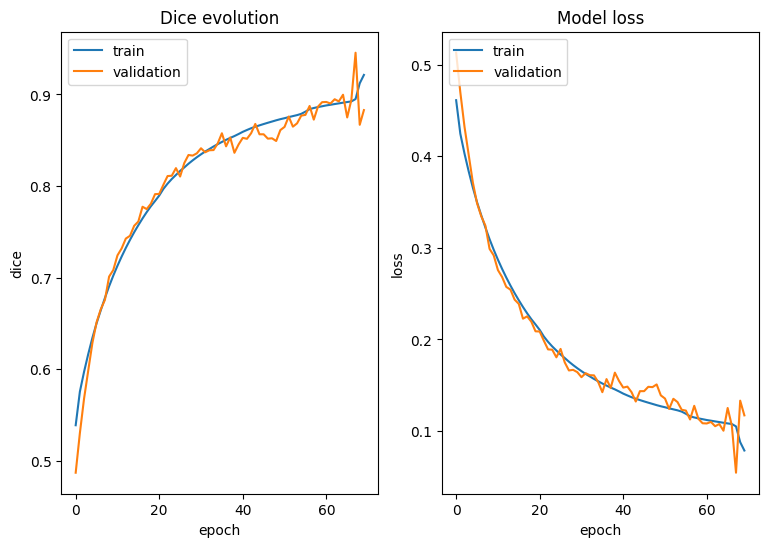

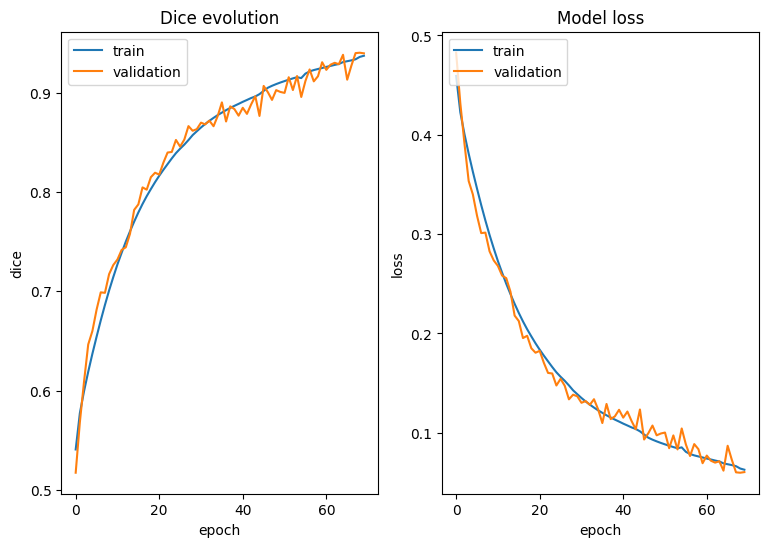

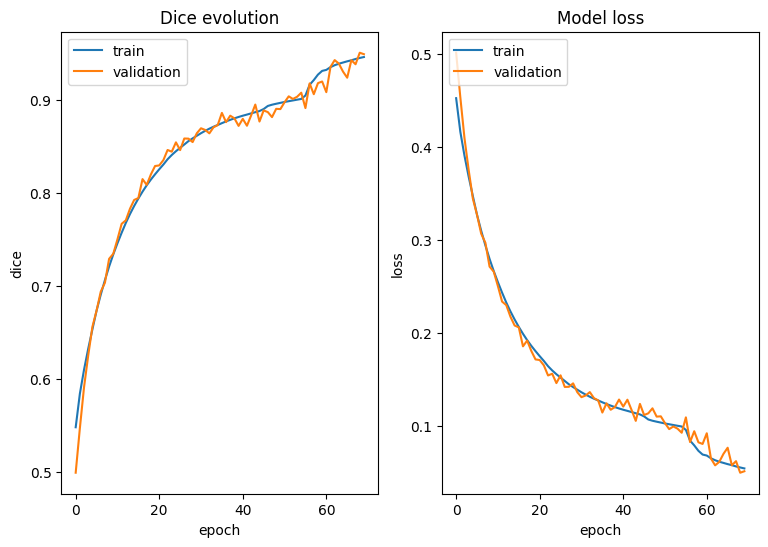

In [17]:
dubtosos = [6e-4, 7e-4, 8e-4]
for d in dubtosos:
    # primer, cal inicialitzar la xarxa i entrenar-la amb els nous paràmetres:
    segnet = build_segnet(input_shape=(256, 256, 3))
    segnet.compile(optimizer=Adam(learning_rate = d), loss=dice_loss, metrics = [dice_mean, dice_wound, dice_staple])
    
    BATCH_SIZE = 5
    TOTAL_IMAGES_TRAIN = 275
    TOTAL_IMAGES_TEST = 119
    STEPS_PER_EPOCH = TOTAL_IMAGES_TRAIN // BATCH_SIZE 
    VALIDATION_STEPS = TOTAL_IMAGES_TEST // BATCH_SIZE
    EPOCHS = 70

    reduceLROnPlat = ReduceLROnPlateau(monitor='dice_mean', factor=0.5,
                                       patience=3,
                                       verbose=1, mode='max', cooldown=2, min_lr=1e-7)
    early = EarlyStopping(monitor="dice_mean",
                          mode="max",
                          patience=8)

    CALLBACKS = [early, reduceLROnPlat]

    TRAIN_GENERATOR = cnn_generator(images=IMAGES_TRAIN,
                                masks_wound=GROUND_TRUTHS_WOUND_TRAIN,
                                masks_staple=GROUND_TRUTHS_STAPLE_TRAIN,
                                batch_size=BATCH_SIZE)

    TEST_GENERATOR = cnn_generator(images=IMAGES_TEST,
                                   masks_wound=GROUND_TRUTHS_WOUND_TEST,
                                   masks_staple=GROUND_TRUTHS_STAPLE_TEST,
                                   batch_size=BATCH_SIZE)
    
    training_history = segnet.fit(TRAIN_GENERATOR, 
                           validation_data=TEST_GENERATOR,
                           epochs=EPOCHS,
                           validation_steps=2,
                           callbacks=CALLBACKS,
                           steps_per_epoch=STEPS_PER_EPOCH)
    
    plt.figure(figsize=(9,6), dpi= 100, facecolor='w', edgecolor='k')

    plt.subplot(1,2,1)
    plt.plot(training_history.history['dice_mean'])
    plt.plot(training_history.history['val_dice_mean'])
    plt.title('Dice evolution')
    plt.ylabel('dice')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')

    # "Loss"
    plt.subplot(1,2,2)
    plt.plot(training_history.history['loss'])
    plt.plot(training_history.history['val_loss'])
    plt.title('Model loss')
    plt.ylabel('loss')
    plt.xlabel('epoch')
    plt.legend(['train', 'validation'], loc='upper left')

    EXPERIMENT_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment05'
    plt.savefig(EXPERIMENT_PATH+rf"/segnet_multitasca_rendiment_prova2_{d}.png")
    
    # ara, avaluem-la:
    train_eval(segnet, d)
    test_eval(segnet, d)
    
    # en darrer lloc, cal esborrar-la 
    del segnet

## Algunes prediccions:
Per a poder veure com de bé ho fa la xarxa SegNet, guardarem algunes prediccions. En aquest cas, seleccionarem 15 imatges del DS (les 10 millors segons la mètrica dice i les 5 pitjors) i en guardarem a la carpeta 'Resultats' 

Ara implementarem diverses funcions per a obtenir visualitzacions dels resultats

In [14]:
# funció ppal que cridarà a les altres:
def visualitzacions(model, noms_imatges: list, ruta_imatges: str, rutes_gt: list, input_size: int, ruta_guardar: str, titol: str):
    k = 1 
    for nom in noms_imatges:
        if nom.endswith('resolution=1.png'):
            qualitat = 1
        else:
            qualitat = 0
        # carregam la imatge, les gts i feim les prediccions
        imatge = cv2.imread(os.path.join(ruta_imatges, nom), 1) # en color
        gt_f = cv2.imread(os.path.join(rutes_gt[0], nom), 0) # escala de grisos
        gt_g = cv2.imread(os.path.join(rutes_gt[1], nom), 0) # escala de grisos
        prediccio_f, prediccio_g = predict_image(model=model, model_input=(input_size, input_size), image=imatge)
        
        # cridam a la funció que dibuixa les prediccions sobre la imatge original
        res1_f = mascara(imatge,prediccio_f)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_mascara_f.png", res1_f)
        res1_g = mascara(imatge,prediccio_g)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_mascara_g.png", res1_g)
        
        # cridam a la funció que dibuixa els contorns de la predicció i de la gt sobre la imatge original
        res2_f = contorns(imatge, prediccio_f, gt_f, qualitat)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_contorns_f.png", res2_f)
        plt.imshow(res2_f)
        plt.show()
        
        res2_g = contorns(imatge, prediccio_g, gt_g, qualitat)
        cv2.imwrite(ruta_guardar+rf"/{titol}_{k}_contorns_g.png", res2_g)
        plt.imshow(res2_g)
        plt.show()
        
        k += 1

In [15]:
# funció auxiliar que dibuixa la predicció sobre la imatge original:
def mascara(imatge, prediccio):
    mascara = imatge.copy()
    for i in range(imatge.shape[0]):
        for j in range(imatge.shape[1]):
            if prediccio[i, j] > 0:  
                mascara[i, j] = [107,183,189]  # Paint in yellow
    return mascara    

In [16]:
# funció auxiliar que dibuixa els contorns de la gt i de la prediccio sobre la imatge original:
# color gt = green; color prediccio = red
def contorns(imatge, prediccio, gt, qualitat):
    resultat = imatge.copy()
    # PREDICCIO
    # find contours with hierarchy
    contours, hier = cv2.findContours(prediccio.astype(numpy.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_NONE)
                                                # how the contours are retrieved and organized, contour approximation method
    # Define sufficient enough colors for blobs (taques)
    colors = [(0, 255, 0), (0, 0, 255)] # green and red (BGR format)
    k = -1
    for i, cnt in enumerate(contours):
        if (hier[0, i, 3] == -1):  # Check if the current contour has no parent, i.e., the contour is an external contour
            k += 1
        if qualitat == 1:
            cv2.drawContours(resultat, [cnt], -1, colors[1], 5) #pintam la predicció de vermell
        else:
            cv2.drawContours(resultat, [cnt], -1, colors[1], 1) #pintam la predicció de vermell

        
    # GT
    # find contours with hierarchy
    contours, hier = cv2.findContours(gt.astype(numpy.uint8), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
                                                # how the contours are retrieved and organized, contour approximation method
    k = -1
    for i, cnt in enumerate(contours):
        if (hier[0, i, 3] == -1):  # Check if the current contour has no parent, i.e., the contour is an external contour
            k += 1
        if qualitat == 1:
            cv2.drawContours(resultat, [cnt], -1, colors[0], 5) #pintam la gt de verd
        else:
            cv2.drawContours(resultat, [cnt], -1, colors[0], 1) #pintam la gt de verd
    return resultat

Ara sí, anem a guardar els resultats:

## Filtratge 1: millors i pitjors imatges d'alta resolució

In [25]:
#carregam el df
# carregam el data frame de test:
import pandas as pd
df = pd.read_csv('/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment03/erfnet_multitasca_test_prova_0.0006.csv')

# filtram les imatges d'alta resolució -> df1:
df1 = df[df['NOM'].str.endswith('resolution=1.png')]

# eliminam les que NO tenen cap grapa
noms_sense = ['qfBqdnHgJkPwfL4apJ8o2N4na_infection=0_capture=1_resolution=1.png',
              'KnclSSvSGyJt26zuAelrcgQ6b_infection=0_capture=1_resolution=1.png',
             'djnIcpMtGUmA2PAxIYTDpdD9y_infection=0_capture=1_resolution=1.png',
             'YzLNpYW33lmFgkqNRUKgIzj1J_infection=0_capture=1_resolution=1.png']
df1 = df1[~df1['NOM'].isin(noms_sense)].reset_index(drop=True)

# l'ordenam en funció del coeficient dice
df1_sorted = df1.sort_values(by='DICE_mean',ascending=False).reset_index(drop=True)# ordenem el df de major a menor coef. de dice
                                                       # per a accedir més fàcilment a les imatges que volem seleccionar

print(df1_sorted)
# l'ordenam en funció del coeficient dice
df1_sorted = df1.sort_values(by='DICE_mean',ascending=False).reset_index(drop=True)# ordenem el df de major a menor coef. de dice
                                                       # per a accedir més fàcilment a les imatges que volem seleccionar

print(df1_sorted)

                                                  NOM    DICE_f  JACCARD_f  \
0   mYK7RLzwiniuS242ozwJGMnVp_infection=0_capture=...  0.922345   0.855882   
1   CTkubOmT4jGHMcyOn9CkdXtGK_infection=0_capture=...  0.913958   0.841550   
2   2FrdqfR9OA980pwauusQZJ3Th_infection=0_capture=...  0.910480   0.835671   
3   XFTnygo35Pqz4remF7QvNtYPs_infection=0_capture=...  0.890468   0.802562   
4   nb97c8Db0W3ZBwtED6ZApyfS1_infection=1_capture=...  0.887576   0.797876   
..                                                ...       ...        ...   
61  8zpsEV37Nu44DlfhcE1IxFaVq_infection=0_capture=...  0.150094   0.081136   
62  iCu5nHJ3xLx4K2qWYbG3dOEPo_infection=0_capture=...  0.119872   0.063757   
63  8piW6sYXVXcnN0wrTngX8mo5K_infection=1_capture=...  0.111060   0.058795   
64  OsrZmLCXyemFXvMtvd80E3yk2_infection=0_capture=...  0.098567   0.051838   
65  RkD87UBnT8JZWcIj3DpAjGGa1_infection=0_capture=...  0.046560   0.023835   

     TP_f  FN_f    FP_f    TN_f    DICE_g  JACCARD_g   TP_g    

In [26]:
nom_tots = []
dice_tots = []

# seleccionam les 10 millors
nom_millors = []
for i in range(10):
    nom = df1_sorted.loc[i,"NOM"]
    nom_millors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(df1_sorted.loc[i,"DICE_mean"])
    
# seleccionam les 5 pitjors
nom_pitjors = []
n = df1_sorted.shape[0]
# iteram a les 5 darreres files
for i in range(n-5,n):
    nom = df1_sorted.loc[i,"NOM"]
    dice_value = df1_sorted.loc[i,"DICE_mean"]
    nom_pitjors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(dice_value)
#print(nom_millors)
print(nom_tots) 
print(dice_tots)
resultats_segnet_alta = pd.DataFrame({'NOM':nom_tots, 'DICE':dice_tots})
# el guardam com un arxiu .csv en la carpeta resultats
RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment05/segnet_multitasca_resultats_alta.csv'
resultats_segnet_alta.to_csv(RESULTATS_PATH, index=False)


['mYK7RLzwiniuS242ozwJGMnVp_infection=0_capture=1_resolution=1.png', 'CTkubOmT4jGHMcyOn9CkdXtGK_infection=0_capture=1_resolution=1.png', '2FrdqfR9OA980pwauusQZJ3Th_infection=0_capture=0_resolution=1.png', 'XFTnygo35Pqz4remF7QvNtYPs_infection=0_capture=1_resolution=1.png', 'nb97c8Db0W3ZBwtED6ZApyfS1_infection=1_capture=0_resolution=1.png', 'TBNtKYTcLfWmsAq7HPMBqhoIP_infection=0_capture=0_resolution=1.png', 'c333lDWLYrwrLnm638Bhx9UiW_infection=0_capture=1_resolution=1.png', 'yM7CmeNb3hdE4egCVczHc1Oh2_infection=0_capture=0_resolution=1.png', 'j8pTkNIWfF6QcgTYUeCuV01my_infection=0_capture=0_resolution=1.png', 'cmXdDDV3WNmd4ghvPpgDFBEBq_infection=0_capture=1_resolution=1.png', '8zpsEV37Nu44DlfhcE1IxFaVq_infection=0_capture=1_resolution=1.png', 'iCu5nHJ3xLx4K2qWYbG3dOEPo_infection=0_capture=1_resolution=1.png', '8piW6sYXVXcnN0wrTngX8mo5K_infection=1_capture=1_resolution=1.png', 'OsrZmLCXyemFXvMtvd80E3yk2_infection=0_capture=0_resolution=1.png', 'RkD87UBnT8JZWcIj3DpAjGGa1_infection=0_capture=

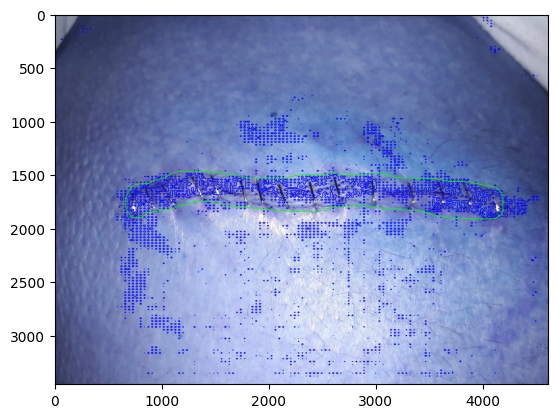

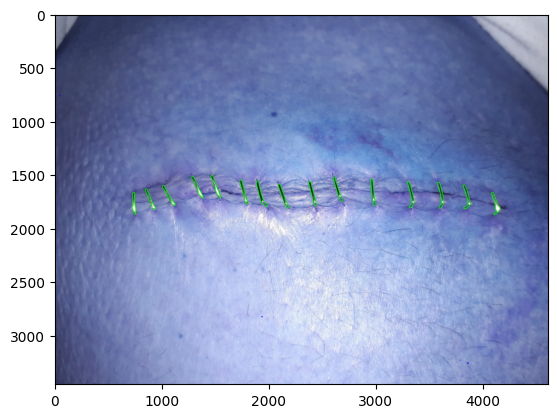

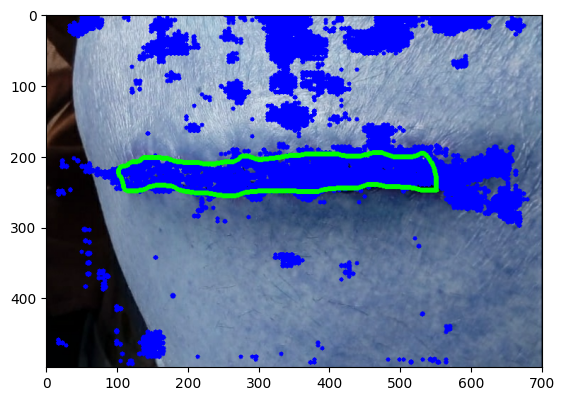

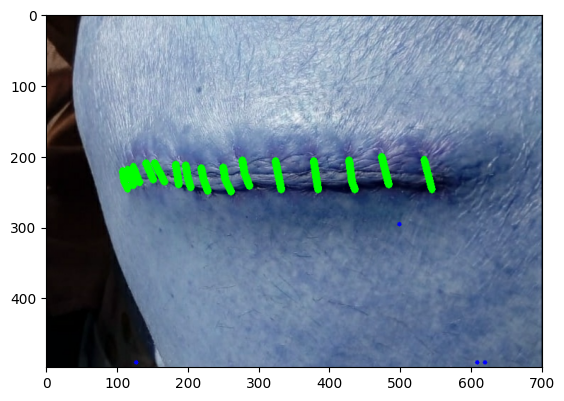

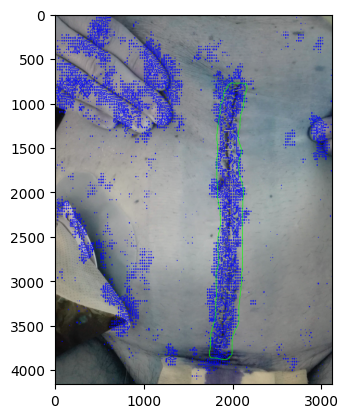

...

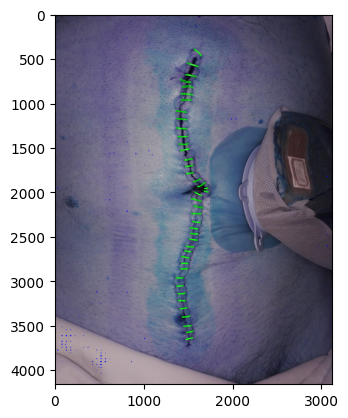

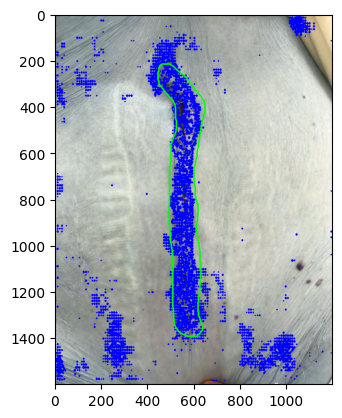

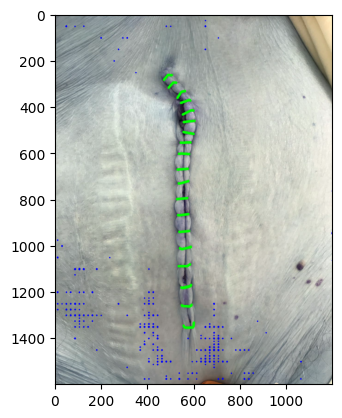

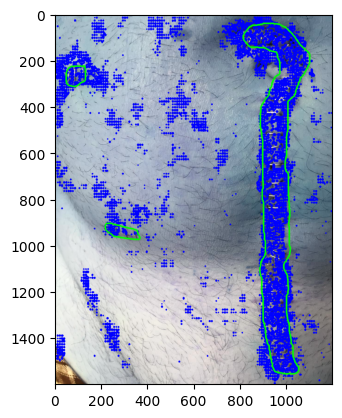

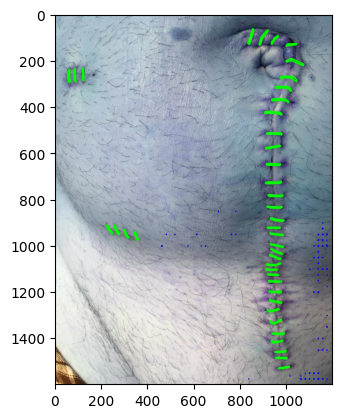

In [27]:
# guardam les millors
REDSCAR_DATASET = "/home/marc/UIB_EXPERIMENTS/REDSCAR"
REDSCAR_DATASET_TEST = os.path.join(REDSCAR_DATASET, "SUBSETS", "MACHINE_LEARNING_DATASET", "test")
ruta_imatge = os.path.join(REDSCAR_DATASET_TEST,'IMAGES')
ruta_gt_f = os.path.join(REDSCAR_DATASET_TEST,'GT_WOUND_MASK')
ruta_gt_g = os.path.join(REDSCAR_DATASET_TEST,'GT_STAPLES_MASK')
ruta_imatge = os.path.join(REDSCAR_DATASET_TEST,'IMAGES')
rutes_gt = [ruta_gt_f, ruta_gt_g]

ruta_millors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment05/alta_resolucio_10_millors'
# guardam les millors
visualitzacions(model=loaded_model, noms_imatges=nom_millors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_millors, titol="millor")

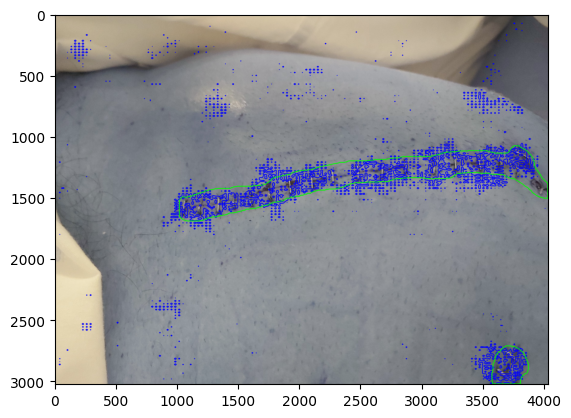

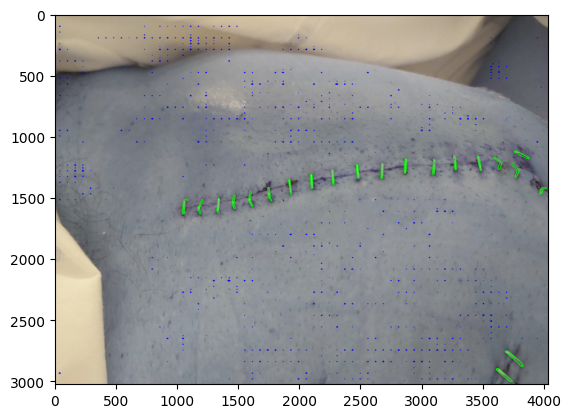

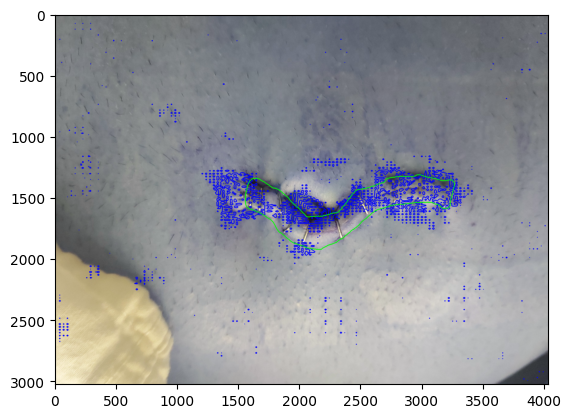

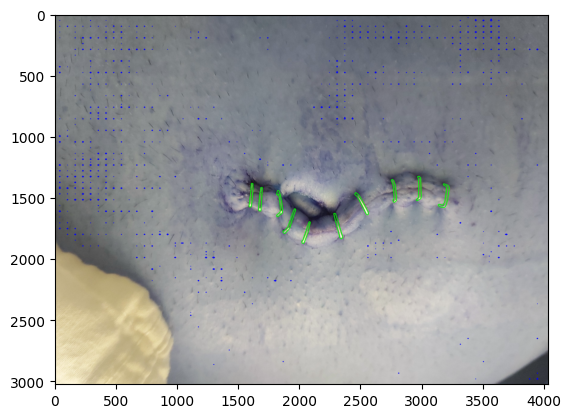

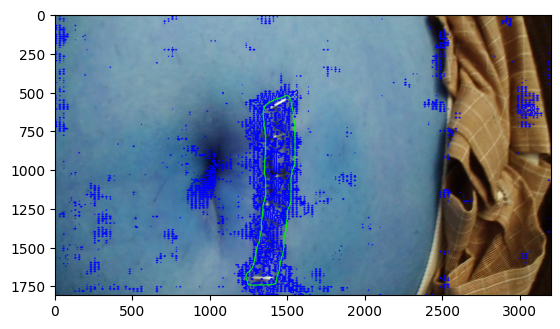

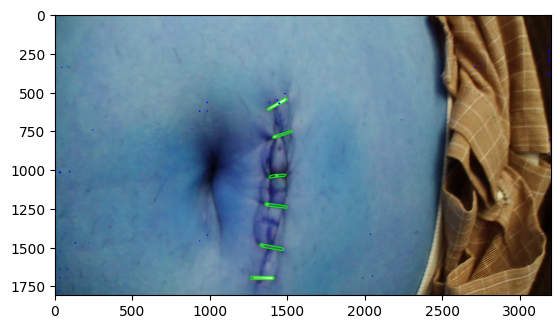

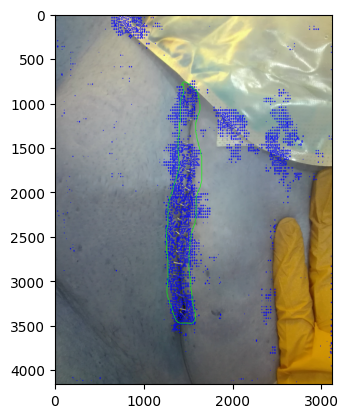

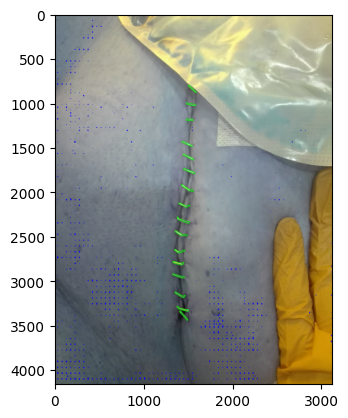

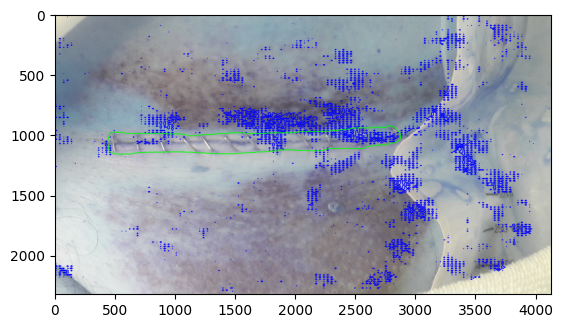

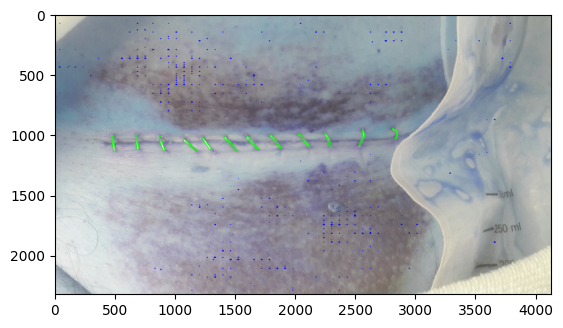

In [28]:
ruta_pitjors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment05/alta_resolucio_5_pitjors'
# guardam les pitjors
visualitzacions(model=loaded_model, noms_imatges=nom_pitjors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_pitjors, titol="pitjor")


## Filtratge 2: millors i pitjors imatges de baixa resolució

In [29]:
# filtram les imatges d'alta resolució -> df2:
df2 = df[df['NOM'].str.endswith('resolution=0.png')]

# eliminam les que NO tenen cap grapa
noms_sense = ['BSmmQo7gZrySCxbaqbqcUrv2F_infection=0_capture=1_resolution=0.png',
             'fEMdP896R7Ns2a6mtbb0uGbpT_infection=0_capture=1_resolution=0.png',
             'YH30nPmh3tokV3aNsPNrFNtpt_infection=0_capture=1_resolution=0.png',
             'fgXrcZ3JaNWgGsJWrjpt8kTi8_infection=0_capture=1_resolution=0.png',
             '2XKzbg86QY1lzFzF6xyk8r49M_infection=0_capture=1_resolution=0.png']
df2 = df2[~df2['NOM'].isin(noms_sense)].reset_index(drop=True)

# l'ordenam en funció del coeficient dice
df2_sorted = df2.sort_values(by='DICE_mean',ascending=False).reset_index(drop=True)# ordenem el df de major a menor coef. de dice
                                                       # per a accedir més fàcilment a les imatges que volem seleccionar

print(df2_sorted)

                                                  NOM    DICE_f  JACCARD_f  \
0   WwaDRJJxLPNttOx9plemyMDnn_infection=0_capture=...  0.890075   0.801923   
1   89Cmrsk0up7FIc0NwQcL5vvwS_infection=0_capture=...  0.877031   0.780993   
2   7PsK2pKVrkofRQKGB6yIyAmqv_infection=0_capture=...  0.872081   0.773177   
3   XIIlLL72NJGmdAye6jDJ5O9af_infection=0_capture=...  0.871613   0.772442   
4   oedJksR9vFzg5fybwB07HlNyY_infection=0_capture=...  0.870318   0.770410   
5   SqzMLLMyU4icHeeVFWe5FAuGb_infection=0_capture=...  0.858826   0.752581   
6   xIUmdHjGarh1OLf59VEYPVWKw_infection=0_capture=...  0.858113   0.751487   
7   tSBNbbT8NVk7wj1KEn5UVHOtU_infection=0_capture=...  0.842806   0.728318   
8   B130dg1MOeVf1euZ7ScuyO7JQ_infection=0_capture=...  0.841299   0.726071   
9   1z5Xfs2sYPUbqsqMfZBy23Aan_infection=0_capture=...  0.832300   0.712768   
10  fsQjP7gdPYnqNWbJACkayeaK8_infection=0_capture=...  0.810181   0.680929   
11  80ZIFB9V8RO7fjnFjnU305hnW_infection=0_capture=...  0.806925 

In [30]:
nom_tots = []
dice_tots = []

# seleccionam les 10 millors
nom_millors = []
for i in range(10):
    nom = df2_sorted.loc[i,"NOM"]
    nom_millors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(df2_sorted.loc[i,"DICE_mean"])
    
# seleccionam les 5 pitjors
nom_pitjors = []
n = df2_sorted.shape[0]
# iteram a les 5 darreres files
for i in range(n-5,n):
    nom = df2_sorted.loc[i,"NOM"]
    dice_value = df2_sorted.loc[i,"DICE_mean"]
    nom_pitjors.append(nom)
    nom_tots.append(nom)
    dice_tots.append(dice_value)
#print(nom_millors)
print(nom_tots) 
print(dice_tots)
resultats_segnet_baixa = pd.DataFrame({'NOM':nom_tots, 'DICE':dice_tots})
# el guardam com un arxiu .csv en la carpeta resultats
RESULTATS_PATH = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment05/segnet_multitasca_resultats_baixa.csv'
resultats_segnet_baixa.to_csv(RESULTATS_PATH, index=False)


['WwaDRJJxLPNttOx9plemyMDnn_infection=0_capture=1_resolution=0.png', '89Cmrsk0up7FIc0NwQcL5vvwS_infection=0_capture=1_resolution=0.png', '7PsK2pKVrkofRQKGB6yIyAmqv_infection=0_capture=1_resolution=0.png', 'XIIlLL72NJGmdAye6jDJ5O9af_infection=0_capture=1_resolution=0.png', 'oedJksR9vFzg5fybwB07HlNyY_infection=0_capture=1_resolution=0.png', 'SqzMLLMyU4icHeeVFWe5FAuGb_infection=0_capture=1_resolution=0.png', 'xIUmdHjGarh1OLf59VEYPVWKw_infection=0_capture=1_resolution=0.png', 'tSBNbbT8NVk7wj1KEn5UVHOtU_infection=0_capture=1_resolution=0.png', 'B130dg1MOeVf1euZ7ScuyO7JQ_infection=0_capture=1_resolution=0.png', '1z5Xfs2sYPUbqsqMfZBy23Aan_infection=0_capture=1_resolution=0.png', 'Nnq9VMIujxGziNrbm89UxZ6SK_infection=0_capture=1_resolution=0.png', 'p6xQYsfGY4jr5qpvXgzJSett2_infection=0_capture=1_resolution=0.png', 'P7ko6al1C04gK6LG4DYe7jIzs_infection=1_capture=1_resolution=0.png', '8mTEnDd4Y3Qcau30mFPKFrpND_infection=0_capture=1_resolution=0.png', 'cTiK8ZgzLbF0IPJCdOmxdRieJ_infection=0_capture=

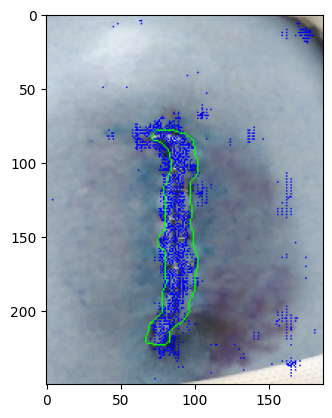

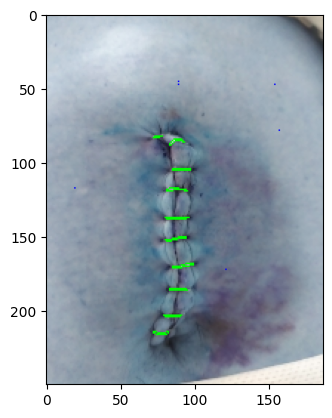

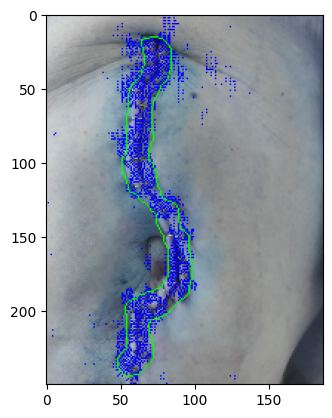

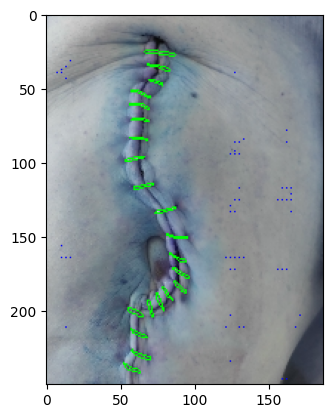

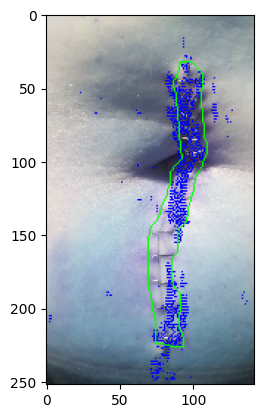

...

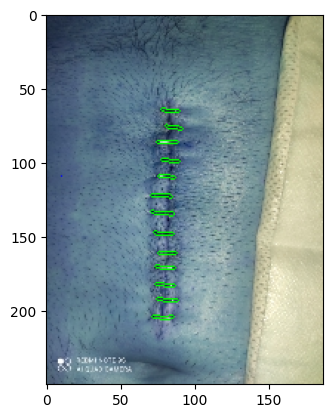

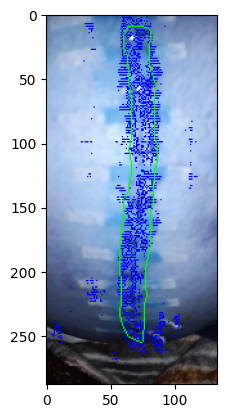

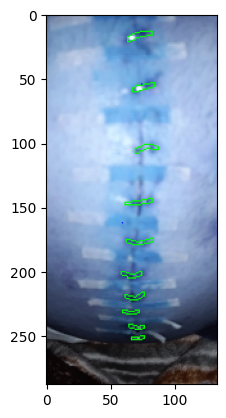

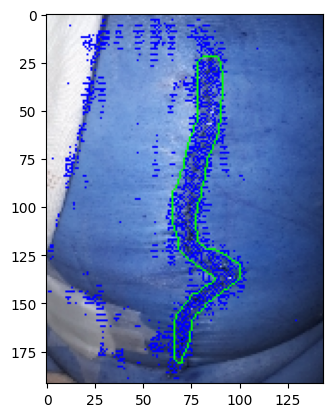

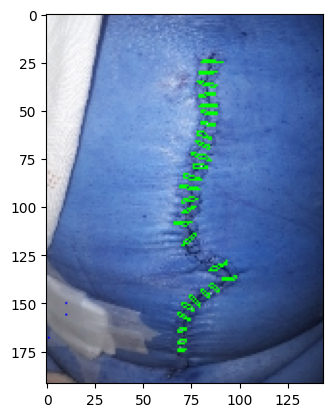

In [31]:
ruta_millors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment05/baixa_resolucio_10_millors'
# guardam les millors
visualitzacions(model=loaded_model, noms_imatges=nom_millors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_millors, titol="millor")


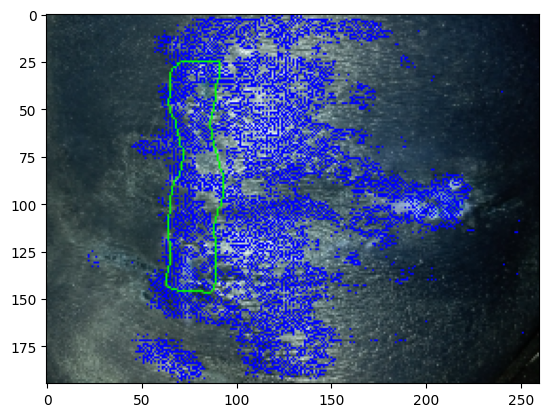

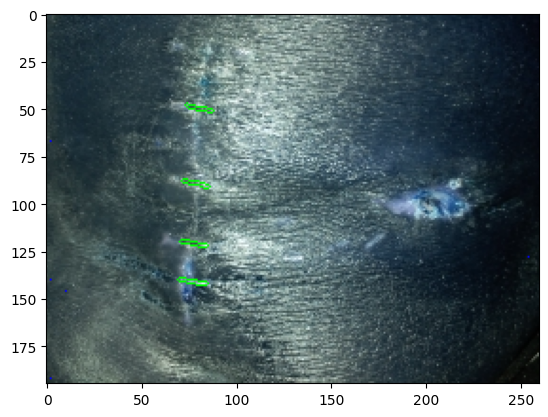

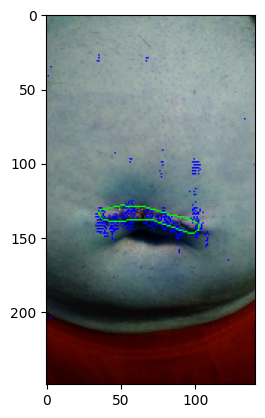

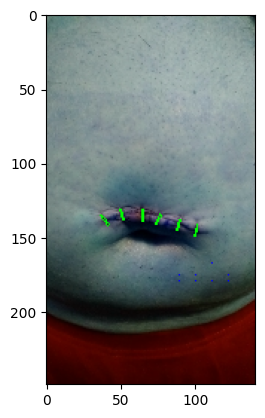

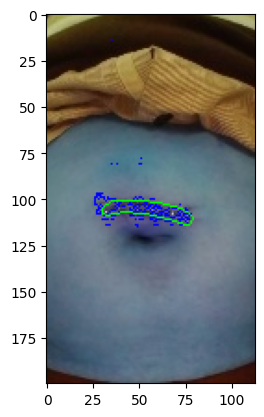

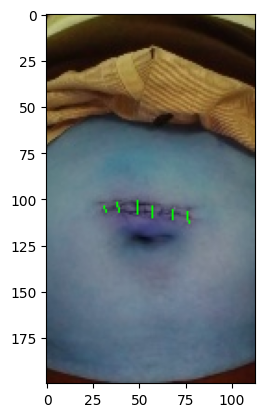

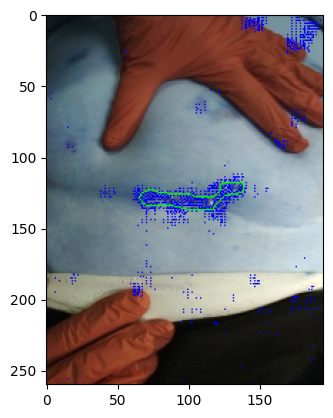

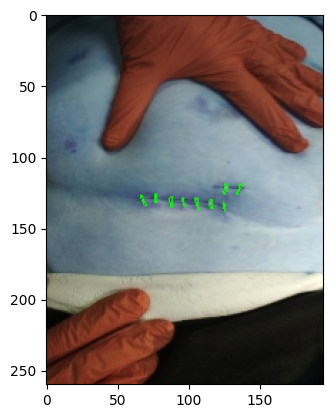

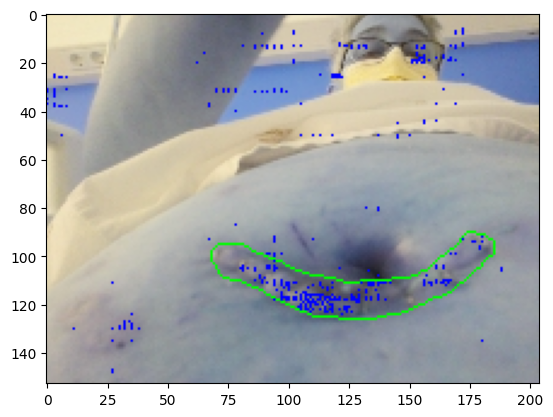

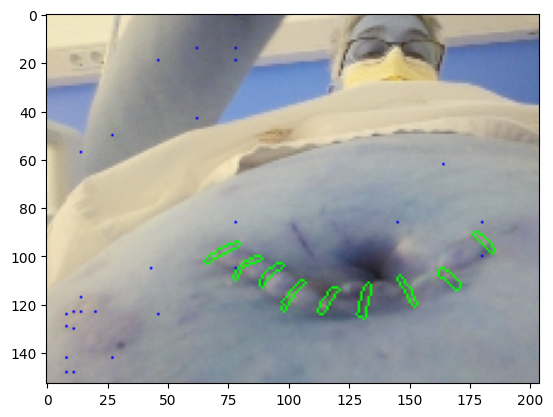

In [32]:
ruta_pitjors = '/home/marc/ANGELS_EXPERIMENTS/Results2/Experiment05/baixa_resolucio_5_pitjors'
# guardam les pitjors
visualitzacions(model=loaded_model, noms_imatges=nom_pitjors, ruta_imatges=ruta_imatge, rutes_gt=rutes_gt, input_size=256, ruta_guardar = ruta_pitjors, titol="pitjor")
